#  **Project Title: New York State Hospital Inpatient Discharge**
### **Batch details: July’22 Online Batch**
### **Group Number: 6**
### **Mentor: Vidhya K**
### **Team Members:**
-  Aditya Aryan
-  Mahima Bhardwaj
-  Morvi Kohad
-  Shailja Barsaiyan
-  Shrika Garg

**Case Study Scenario:** This is the public dataset made available by the Dept of Health of New York state.

The dataset consists of 2101588 rows, 33 columns which describes healthcare records on different type of parameter.

Task is to create a machine learning model which can predict Length of the stay and Risk of Mortatlity on the basis of obsereved data.

**As five key areas where avoidable days, i.e. unnecessary additions to length of stay, can make a negative impact.**

**Clinical:** The longer an individual occupies a bed in your acute facility, the longer that person will require clinical attention from staff whose time could be better spent elsewhere. 

**Financial:** There’s also financial incentive for moving patients to a more appropriate bed.

**Strategic:** Mishandled length of stay is a strategic problem. And it’s when you start approaching it with the same vigor that you would any other problem at your hospital that you can realize extensive cost savings, revenue growth, and improved outcomes.

**Operational:** Length of stay affects a wide variety of health systems operations. The following is a list of the big ones, but rest assured there are even more than this:

- Staff unable to work top of license
- Patient intake compromised
- Cleaning and sanitization procedures delayed
- Over-extension of beds, medications, medical devices

**Experiential:** The patient experience can be severely compromised if the individual must wait in a bed for longer than is clinically necessary.

**In below case study performing the step by step approach to create a Machine Learning predictive model.**

**The flow of the case study is as below:**

* [Reading the data in python](#1)
* [Defining the problem statement](#2)
* [Identifying the Target variable](#3)
* [Looking at the distribution of Target variable](#4)
* [Basic Data exploration](#5)
* [Missing Values treatment](#6)
* [Outlier treatment](#7)
* [Visual Exploratory Data Analysis for data distribution](#8)
* [Feature Selection and Transformation based on EDA](#9)
* [Feature Encoding and Converting datatype to numeric for ML](#10)
* [Regression Problem Statement for Length of Stay](#11)
* [Classification Problem Statement for Risk of Mortality](#12)
* [PCA & KMeans Clustering for Demographic Variations](#13)
* [Conclusion](#14)


## **Data description**

The business meaning of each column in the data is as below:

Column Descripiton: https://health.data.ny.gov/Health/Hospital-Inpatient-Discharges-SPARCS-De-Identified/tg3i-cinn

-  **Hospital Service Area:** A description of the Health Service Area (HSA) in which the hospital is located. Capital/Adirondack, Central NY, Finger Lakes, Hudson Valley, Long Island, New York City, Southern Tier, Western NY.
-  **Hospital County:** A description of the county in which the hospital is located. 
-  **Operating Certificate Number:** The facility Operating Certificate Number as assigned by NYS Department of Health.
-  **Permanent Facility Id:** Permanent Facility Identifier.
-  **Facility Name:** The name of the facility where services were performed based on the Permanent Facility Identifier (PFI), as maintained by the NY Division of Health Facility Planning.
-  **Age Group:** Age in years at time of discharge. Grouped into the following age groups: 0 to 17, 18 to 29, 30 to 49, 50 to 69, and 70 or Older.
-  **Zip Code - 3 digits:** The first three digits of the patient's zip code.
-  **Gender:** Patient gender.
-  **Race:** Patient race.
-  **Ethnicity:** Patient ethnicity.
-  **Length of Stay:** The total number of patient days at an acute level and/or other than acute care level.
-  **Type of Admission:**  A description of the manner in which the patient was admitted to the health care facility.
-  **Patient Disposition:** The patient's destination or status upon discharge.
-  **Discharge Year:** The year of discharge.
-  **CCSR Diagnosis Code:** AHRQ Clinical Classification Software Refined (CCSR) Diagnosis  Category Code.
-  **CCSR Diagnosis Description:**  AHRQ Clinical Classification Software Refined (CCSR) Diagnosis  Category Description.
-  **CCSR Procedure Code:** AHRQ Clinical Classification Software Refined (CCSR) ICD-10 Procedure Category Code.
-  **CCSR Procedure Description:** AHRQ Clinical Classification Software Refined (CCSR) ICD-10 Procedure Category Description.
-  **APR DRG Code:** The All Patients Refined Diagnosis Related Groups (APR-DRG) Classification Code.
-  **APR DRG Description:** The APR-DRG Classification Code Description in Calendar Year 2021.
-  **APR MDC Code:** All Patient Refined Major Diagnostic Category (APR MDC) Code. APR-DRG Codes 001-006 and 950-956 may group to more than one MDC Code.
-  **APR MDC Description:** All Patient Refined Major Diagnostic Category (APR MDC) Description.
-  **APR Severity of Illness Code:** The APR-DRG Severity of Illness Code: 0, 1, 2, 3, 4.
-  **APR Severity of Illness Description:** All Patient Refined Severity of Illness (APR SOI) Description.
-  **APR Risk of Mortality:** All Patient Refined Risk of Mortality (APR ROM) Description.
-  **APR Medical Surgical Description:** The APR-DRG specific classification of Medical, Surgical or Not Applicable.
-  **Payment Typology 1:** A description of the type of payment for this occurrence.
-  **Payment Typology 2:** A description of the type of payment for this occurrence.
-  **Payment Typology 3:** A description of the type of payment for this occurrence.
-  **Birth Weight:** The neonate(infant) birth weight in grams; rounded to nearest 100 g.
-  **Emergency Department Indicator:** The Emergency Department Indicator is set based on the submitted revenue codes. If the record contained an Emergency Department revenue code of 045X, the indicator is set to "Y", otherwise it will be “N”.
-  **Total Charges:** Total charges for the discharge.
-  **Total Costs:** Total estimated cost for the discharge.

### Importing libraries

In [1]:
# import pandas library
import pandas as pd

# import numpy library
import numpy as np

# import seaborn library
import seaborn as sns

# import matplotlib library
import matplotlib.pyplot as plt

# import stats library
from scipy import stats

# import labelEncoder
from sklearn.preprocessing import LabelEncoder

# import train test split
from sklearn.model_selection import train_test_split,GridSearchCV

# import time library
import time

import statsmodels.api as sm 

# import breuschpagan
from statsmodels.stats.api import het_breuschpagan

# import qqplot
from statsmodels.graphics.gofplots import qqplot

# import crossval
from sklearn.model_selection import cross_val_score

# import Stander Scaler
from sklearn.preprocessing import StandardScaler

# importing libraries to calculte errors of the model
from sklearn.metrics import mean_squared_error,mean_absolute_error,mean_absolute_percentage_error,r2_score

# import Regression libraries
from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet,SGDRegressor,SGDClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor
from xgboost import XGBRegressor

# improt label_binarize library
from sklearn.preprocessing import label_binarize

# import Classification libraries
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,StackingClassifier
from xgboost import XGBClassifier

# import variance_inflation_factor
from statsmodels.stats.outliers_influence import variance_inflation_factor

# import perfromance metrics
from sklearn.metrics import roc_auc_score,roc_curve,accuracy_score,precision_score,recall_score,cohen_kappa_score,f1_score,confusion_matrix,classification_report
from sklearn.metrics import silhouette_score, silhouette_samples


# import PCA library
from sklearn.decomposition import PCA

# import clustering algorithms 
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering,DBSCAN
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.neighbors import NearestNeighbors

from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import cophenet


# # import warning library to suppress warnings
from warnings import filterwarnings
filterwarnings('ignore')


In [2]:
pd.set_option('display.max_rows',None)
pd.set_option('display.max_columns',None)


<a id=1></a>
### 1. Reading the data in python

**As our dataset contains 21Lakh+ rows, for the ease of calculation and building models we are taking subset of 6lakh rows.**

In [3]:
health_data = pd.read_csv('Hospital_Inpatient_Discharges__SPARCS_De-Identified___2021_subset.csv',low_memory=False)

<a id=2></a>
### 2. Defining the problem statement

**Create a ML model which can predict the Length of stay of the patient.**

* Target Variable: Length of Stay
* Predictors: Hospital County, Permanent Facility Id, Diagnosis code etc.

<a id=3></a>
### 3.Determining the type of Machine Learning


Based on the problem statement we can understand that we need to create a **supervised ML Regression model**, as the target variable is continuous.

<a id=4></a>
### 4. Looking at the distribution of Target variable

In [4]:
health_data['Length of Stay'].unique()

array(['1', '3', '16', '5', '4', '13', '27', '2', '28', '9', '8', '6',
       '15', '14', '21', '43', '18', '19', '11', '48', '7', '23', '54',
       '12', '36', '17', '10', '24', '69', '50', '32', '41', '25', '20',
       '22', '30', '26', '83', '60', '29', '61', '39', '53', '45', '33',
       '38', '42', '34', '52', '40', '31', '49', '91', '73', '120 +',
       '35', '77', '93', '37', '72', '78', '67', '55', '79', '46', '82',
       '51', '56', '108', '94', '62', '85', '87', '113', '47', '66', '64',
       '99', '116', '89', '68', '70', '65', '104', '105', '90', '44',
       '76', '80', '71', '109', '59', '100', '95', '75', '118', '58',
       '57', '84', '88', '101', '63', '119', '115', '81', '114', '107',
       '74', '103', '106', '97', '110', '86', '102', '96', '98', '111',
       '112', '117', '92'], dtype=object)

**Inference: Length of stay column, which is currently an object. Will convert it to 'int' to allow for the possibility of regression analysis, some entries are written as '120 +', converting it into 120.**

In [5]:
# Converting '120+' to '120' and converting datatype to number 
health_data['Length of Stay'] = health_data['Length of Stay'].replace('120 +','120')
health_data['Length of Stay'] = health_data['Length of Stay'].astype(int)

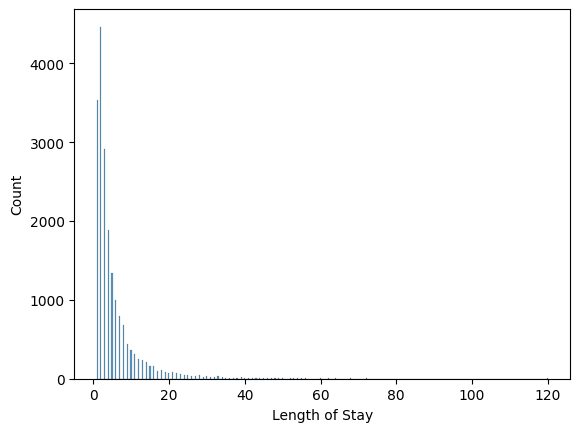

In [6]:
# Creating Bar chart as the Target variable is Continuous

sns.histplot(health_data['Length of Stay'][0:20000])
plt.show()

In [7]:
health_data['Length of Stay'].skew()

5.779181769328276

**Inference: Data distribution of the target variable is positivley skewed and acceptable to proceed for further steps.**

<a id=5></a>
### 5. Basic Data Exploration

In [8]:
# Looking at sample rows in the data
health_data.head(3)

,Hospital Service Area,Hospital County,Operating Certificate Number,Permanent Facility Id,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,Discharge Year,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Code,APR DRG Description,APR MDC Code,APR MDC Description,APR Severity of Illness Code,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Payment Typology 2,Payment Typology 3,Birth Weight,Emergency Department Indicator,Total Charges,Total Costs
0,Long Island,Nassau,2950001.0,527.0,Mount Sinai South Nassau,70 or Older,115,M,White,Not Span/Hispanic,1,Emergency,Home or Self Care,2021,GEN006,OTHER SPECIFIED AND UNSPECIFIED DISEASES OF KI...,URN003,URETER AND OTHER URINARY TRACT DILATION,465,URINARY STONES AND ACQUIRED UPPER URINARY TRAC...,11,DISEASES AND DISORDERS OF THE KIDNEY AND URINA...,2,Moderate,Moderate,Medical,Medicare,Medicare,NaN,NaN,Y,44700.74,5665.27
1,Long Island,Suffolk,5153000.0,913.0,Huntington Hospital,70 or Older,117,F,Black/African American,Not Span/Hispanic,3,Emergency,Home or Self Care,2021,DIG004,ESOPHAGEAL DISORDERS,NaN,NaN,243,OTHER ESOPHAGEAL DISORDERS,6,DISEASES AND DISORDERS OF THE DIGESTIVE SYSTEM,2,Moderate,Minor,Medical,Medicare,Medicare,Federal/State/Local/VA,NaN,Y,28758.57,7316.03
2,New York City,Richmond,7004003.0,1737.0,Staten Island University Hospital Prince's Bay,50 to 69,103,M,White,Spanish/Hispanic,1,Elective,Home w/ Home Health Services,2021,MUS006,OSTEOARTHRITIS,MST006,KNEE ARTHROPLASTY,326,ELECTIVE KNEE JOINT REPLACEMENT,8,DISEASES AND DISORDERS OF THE MUSCULOSKELETAL ...,1,Minor,Minor,Surgical,Medicare,Medicare,Medicaid,NaN,N,49101.93,17500.81


In [9]:
# Looking the shape of the data
health_data.shape

(210158, 33)

In [10]:
# Observing the summarized information of data
# Data types, Missing values based on number of non-null values Vs total rows etc.
health_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 210158 entries, 0 to 210157
Data columns (total 33 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   Hospital Service Area                209092 non-null  object 
 1   Hospital County                      209092 non-null  object 
 2   Operating Certificate Number         208954 non-null  float64
 3   Permanent Facility Id                209092 non-null  float64
 4   Facility Name                        210158 non-null  object 
 5   Age Group                            210158 non-null  object 
 6   Zip Code - 3 digits                  205617 non-null  object 
 7   Gender                               210158 non-null  object 
 8   Race                                 210158 non-null  object 
 9   Ethnicity                            210158 non-null  object 
 10  Length of Stay                       210158 non-null  int32  
 11  Type of Admis

**Inference: In total we have 4 float features, 1 int feature and 24 object features**

In [11]:
# Looking at the descriptive statistics of the numerical features
health_data.describe()

,Operating Certificate Number,Permanent Facility Id,Length of Stay,Discharge Year,APR DRG Code,APR MDC Code,APR Severity of Illness Code,Total Charges,Total Costs
count,2.089540e+05,209092.000000,210158.000000,210158.0,210158.000000,210158.00000,210158.000000,2.101580e+05,2.101580e+05
mean,4.990814e+06,1034.298601,5.718317,2021.0,414.775264,10.29425,2.123778,7.310730e+04,2.196840e+04
std,2.234493e+06,709.204373,8.300452,0.0,244.484140,5.96599,0.955913,1.462143e+05,4.627467e+04
min,1.010000e+05,1.000000,1.000000,2021.0,1.000000,0.00000,0.000000,1.141000e+01,1.330000e+00
25%,2.951001e+06,528.000000,2.000000,2021.0,194.000000,5.00000,1.000000,1.911593e+04,6.034820e+03
50%,5.902001e+06,1046.000000,3.000000,2021.0,384.000000,9.00000,2.000000,3.835074e+04,1.160028e+04
75%,7.002020e+06,1453.000000,6.000000,2021.0,640.000000,15.00000,3.000000,7.724183e+04,2.298025e+04
max,7.004010e+06,10355.000000,120.000000,2021.0,956.000000,25.00000,4.000000,1.021094e+07,3.770450e+06


**Inference: From the above result we can see that Total charges and Total Costs feature consists positive outliers.**

In [12]:
# Looking at the descriptive statistics of the categorical features
health_data.describe(include='object')

,Hospital Service Area,Hospital County,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Description,APR MDC Description,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Payment Typology 2,Payment Typology 3,Birth Weight,Emergency Department Indicator
count,209092,209092,210158,210158,205617,210158,210158,210158,210158,210158,210012,210012,152647,152647,210158,210158,209909,209909,210158,210158,102735,33282,20806,210158
unique,8,57,201,5,50,3,4,4,6,19,452,452,317,317,334,26,4,4,3,9,9,9,56,2
top,New York City,Manhattan,North Shore University Hospital,70 or Older,112,F,White,Not Span/Hispanic,Emergency,Home or Self Care,PNL001,LIVEBORN,PGN002,SPONTANEOUS VAGINAL DELIVERY,"NEONATE BIRTH WEIGHT > 2499 GRAMS, NORMAL NEWB...",DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM,Moderate,Minor,Medical,Medicare,Medicaid,Self-Pay,03200,Y
freq,93756,36711,4996,61979,25358,114258,114282,157668,138353,137599,20031,20031,11257,11257,17270,25872,76322,106843,160563,82222,41785,20596,1719,131585


**Inference: In our dataset we have more number of object type variable which will be handled through encoding.**

**Finding duplicated rows**

In [13]:
health_data.duplicated().sum()

90

In [14]:
# Dropping duplicated records
health_data = health_data[~health_data.duplicated()]
health_data.shape

(210068, 33)

**Inference: In total we have 757 duplicated rows in our dataset, removing it for no redundancy.**

**Unique values of each feature**


In [15]:
for i in health_data.columns:
    print(f'{i} :\n {health_data[i].unique()}\n ')

Hospital Service Area :
 ['Long Island' 'New York City' 'Hudson Valley' 'Capital/Adirond'
 'Western NY' 'Finger Lakes' 'Central NY' 'Southern Tier' nan]
 
Hospital County :
 ['Nassau' 'Suffolk' 'Richmond' 'Manhattan' 'Westchester' 'Kings'
 'Rensselaer' 'Erie' 'Monroe' 'Schenectady' 'Cayuga' 'Bronx' 'Broome'
 'Onondaga' 'Allegany' 'Queens' 'Rockland' 'Chemung' 'Orange' 'Niagara'
 'Dutchess' 'St Lawrence' 'Oneida' 'Warren' 'Columbia' 'Albany' 'Steuben'
 nan 'Ontario' 'Otsego' 'Clinton' 'Franklin' 'Saratoga' 'Tompkins'
 'Jefferson' 'Cattaraugus' 'Montgomery' 'Chenango' 'Ulster' 'Oswego'
 'Fulton' 'Sullivan' 'Schoharie' 'Chautauqua' 'Wayne' 'Cortland' 'Lewis'
 'Genesee' 'Yates' 'Putnam' 'Wyoming' 'Madison' 'Livingston' 'Essex'
 'Orleans' 'Delaware' 'Herkimer' 'Schuyler']
 
Operating Certificate Number :
 [2950001. 5153000. 7004003. 7002024. 7002032. 7002054. 7001020. 5957001.
 4102002. 7002001. 1401005. 2701001. 4601004.  501000. 5149000. 2908000.
 7000008. 5155000. 7000002. 2951001. 46010

APR MDC Description :
 ['DISEASES AND DISORDERS OF THE KIDNEY AND URINARY TRACT'
 'DISEASES AND DISORDERS OF THE DIGESTIVE SYSTEM'
 'DISEASES AND DISORDERS OF THE MUSCULOSKELETAL SYSTEM AND CONNECTIVE TISSUE'
 'DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM'
 'DISEASES AND DISORDERS OF THE RESPIRATORY SYSTEM'
 'INFECTIOUS AND PARASITIC DISEASES (SYSTEMIC OR UNSPECIFIED SITES)'
 'DISEASES AND DISORDERS OF THE NERVOUS SYSTEM'
 'FACTORS INFLUENCING HEALTH STATUS AND OTHER CONTACTS WITH HEALTH SERVICES'
 'PREGNANCY, CHILDBIRTH AND THE PUERPERIUM'
 'NEWBORNS AND OTHER NEONATES WITH CONDITIONS ORIGINATING IN THE PERINATAL PERIOD'
 'DISEASES AND DISORDERS OF THE EYE'
 'ENDOCRINE, NUTRITIONAL AND METABOLIC DISEASES AND DISORDERS'
 'MENTAL DISEASES AND DISORDERS'
 'DISEASES AND DISORDERS OF THE BLOOD AND BLOOD FORMING ORGANS AND IMMUNOLOGICAL DISORDERS'
 'ALCOHOL/DRUG USE AND ALCOHOL/DRUG INDUCED ORGANIC MENTAL DISORDERS'
 'MYELOPROLIFERATIVE DISEASES AND DISORDERS, AND POORLY DIFFERENTIATED 

<a id=6></a>
### 6. Missing Values treatment

In [16]:
(health_data.isnull().mean()*100).sort_values(ascending=False)


Birth Weight                           90.125578
Payment Typology 3                     84.164175
Payment Typology 2                     51.110117
CCSR Procedure Code                    27.351619
CCSR Procedure Description             27.351619
Zip Code - 3 digits                     2.161681
Operating Certificate Number            0.573148
Hospital County                         0.507455
Hospital Service Area                   0.507455
Permanent Facility Id                   0.507455
APR Risk of Mortality                   0.118533
APR Severity of Illness Description     0.118533
CCSR Diagnosis Code                     0.069501
CCSR Diagnosis Description              0.069501
Ethnicity                               0.000000
APR Severity of Illness Code            0.000000
Total Charges                           0.000000
Emergency Department Indicator          0.000000
Facility Name                           0.000000
Age Group                               0.000000
Payment Typology 1  

**Treatment of Null values**

**Dropping 'Birth Weight','Payment Typology 2', 'Payment Typology 3' columns as it contains more than 50% null values and it will be difficult to extract value from them.**

In [17]:
# Dropping mentioned columns
health_data.drop(columns=['Birth Weight','Payment Typology 2', 'Payment Typology 3'],axis =1,inplace=True)


**Imputing NaN values of `CCSR Procedure code` corresponding to the mode of its grouped by `CCSR Diagnosis Code`.**

In [18]:
# 
temp_table_procedure_code = health_data.groupby('CCSR Diagnosis Code')['CCSR Procedure Code'].value_counts().to_frame()
temp_table_procedure_code =temp_table_procedure_code.rename(columns={'CCSR Procedure Code':'count'}).reset_index()
procedure_code_dict = temp_table_procedure_code.sort_values('count').groupby('CCSR Diagnosis Code').last().to_dict()
procedure_code_dict = procedure_code_dict.get('CCSR Procedure Code')


In [19]:
health_data['CCSR Procedure Code'] = health_data['CCSR Procedure Code'].fillna(health_data['CCSR Diagnosis Code'].apply(lambda x: procedure_code_dict.get(x)))


**Imputing the value of `CCSR Procedure Description` corresponding to its `CCSR Procedure Code`.**

In [20]:

temp_table_procedure_des = health_data.groupby('CCSR Procedure Code')['CCSR Procedure Description'].value_counts().to_frame()
temp_table_procedure_des =temp_table_procedure_des.rename(columns={'CCSR Procedure Description':'count'}).reset_index()
procedure_des_dict = temp_table_procedure_des.sort_values('count').groupby('CCSR Procedure Code').last().to_dict()
procedure_des_dict = procedure_des_dict.get('CCSR Procedure Description')


In [21]:
health_data['CCSR Procedure Description'] = health_data['CCSR Procedure Description'].fillna(health_data['CCSR Procedure Code'].map(procedure_des_dict))

In [22]:
health_data[['CCSR Procedure Code','CCSR Procedure Description']].isnull().sum()

CCSR Procedure Code           96
CCSR Procedure Description    96
dtype: int64

**Dropping rows from `['Zip Code - 3 digits','Hospital County','Hospital Service Area','Permanent Facility Id','APR Risk of Mortality','APR Severity of Illness Description','CCSR Diagnosis Code','CCSR Diagnosis Description']` columns which contains NaN values, as it is relatively small number of NaN values and thus will be insignificant to drop.**

**We can drop remaining NaN values from `CCSR Procedure Code` and `CCSR Procedure Description` column.**

In [23]:
health_data.dropna(axis=0,inplace=True)
health_data.isnull().sum()

Hospital Service Area                  0
Hospital County                        0
Operating Certificate Number           0
Permanent Facility Id                  0
Facility Name                          0
Age Group                              0
Zip Code - 3 digits                    0
Gender                                 0
Race                                   0
Ethnicity                              0
Length of Stay                         0
Type of Admission                      0
Patient Disposition                    0
Discharge Year                         0
CCSR Diagnosis Code                    0
CCSR Diagnosis Description             0
CCSR Procedure Code                    0
CCSR Procedure Description             0
APR DRG Code                           0
APR DRG Description                    0
APR MDC Code                           0
APR MDC Description                    0
APR Severity of Illness Code           0
APR Severity of Illness Description    0
APR Risk of Mort

**Dropping Discharge Year Column as the dataset is for one year i.e., 2021 and Operating Certificate Number as it didn't signifies any importance in prediction length of stay.**

In [24]:
health_data.drop(['Operating Certificate Number','Discharge Year'], axis=1,inplace=True)  

**On inspection, 17731 rows in the zip code column had the string 'OOS' instead of a number which seems to be large quantity to simply drop these rows.Thus, will keep these rows and signify them with '999'.**

In [25]:
health_data[health_data['Zip Code - 3 digits'] == 'OOS'].count()[0]

5792

In [26]:
health_data['Zip Code - 3 digits'] = health_data['Zip Code - 3 digits'].apply(lambda x: str(x).replace('OOS','999'))  
health_data['Zip Code - 3 digits'] = health_data['Zip Code - 3 digits'].astype(np.number)


**On inspection found below points:**

**1. 6 rows in the `Gender` column is 'Unknown' imputing it with more repeated value of gender i.e., 'Female'.**

**2. `Type of Admission` of type 'Not Available' has 342 values i.e. 0.06%,imputing it with more repeated value of Type of Admission i.e., 'Emergency'.**

**3. Converting 'Unknown' value of `Ethincity` (as it is 9.17% in the column) based on the `Race` feature as 'Other Race'.**

In [27]:
health_data.Gender.value_counts()

F    111376
M     93774
U         2
Name: Gender, dtype: int64

In [28]:
health_data['Type of Admission'].value_counts()

Emergency        135261
Elective          34141
Newborn           19509
Urgent            15349
Trauma              784
Not Available       108
Name: Type of Admission, dtype: int64

In [29]:
health_data.Gender= health_data['Gender'].str.replace('U','F')

In [30]:
health_data['Type of Admission'] = health_data['Type of Admission'].str.replace('Not Available','Emergency')

In [31]:
round(health_data.Ethnicity.value_counts()/len(health_data)*100,2)

Not Span/Hispanic    75.47
Spanish/Hispanic     15.20
Unknown               9.12
Multi-ethnic          0.22
Name: Ethnicity, dtype: float64

In [32]:
health_data[health_data.Ethnicity=='Unknown'].Race.value_counts()

Other Race                10098
White                      4721
Black/African American     3636
Multi-racial                255
Name: Race, dtype: int64

In [33]:
health_data[health_data.Race=='Other Race'].Ethnicity.value_counts()

Spanish/Hispanic     23013
Not Span/Hispanic    20155
Unknown              10098
Multi-ethnic           133
Name: Ethnicity, dtype: int64

In [34]:
health_data.Ethnicity=health_data.Ethnicity.replace('Unknown','Spanish/Hispanic')
health_data.Ethnicity.value_counts()

Not Span/Hispanic    154824
Spanish/Hispanic      49883
Multi-ethnic            445
Name: Ethnicity, dtype: int64

<a id=7></a>
### 7. Outlier treatment

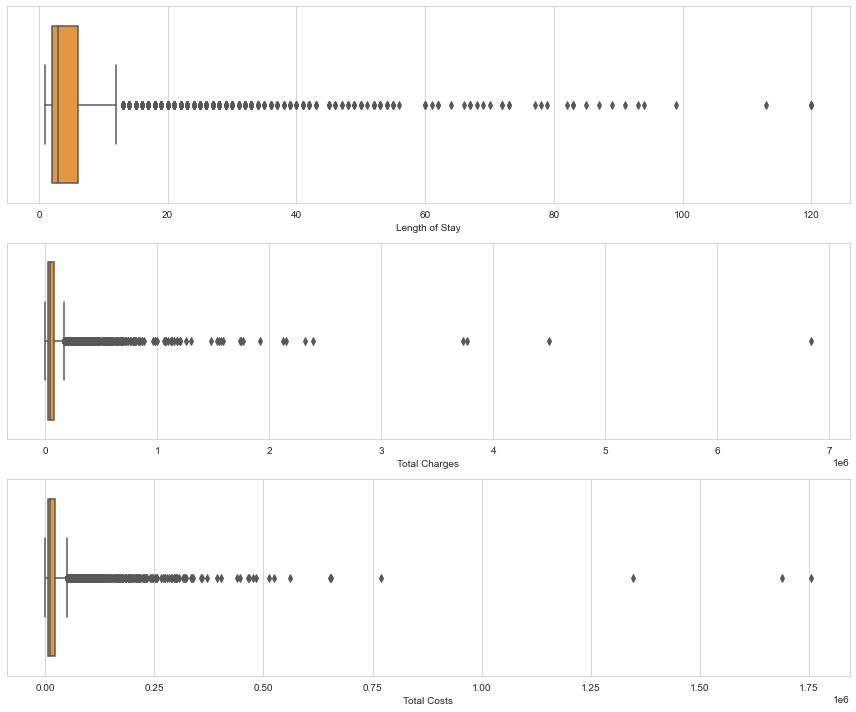

In [425]:
rows = 3
columns = 1
index=1
plt.figure(figsize=(12,10))
for i in ['Length of Stay','Total Charges','Total Costs']:
    plt.subplot(rows,columns,index)
    sns.boxplot(x= health_data[i][0:10000],palette="YlOrBr")
    index+=1
plt.tight_layout()
plt.show()

**Inference: From above graphs we can see that outliers in the Total Charges and Total Costs, will handle it in later steps through transformation.**

<a id=8></a>
### 8. Visual Exploratory Data Analysis for data distribution 

<h3>a. Univariate Analysis - Categorical</h3>

In [35]:
cat_cols = ['Hospital Service Area','Age Group','Gender','Race','Ethnicity','Type of Admission','Patient Disposition',
          'APR Severity of Illness Description','APR Risk of Mortality',
          'APR Medical Surgical Description','Payment Typology 1','Emergency Department Indicator']

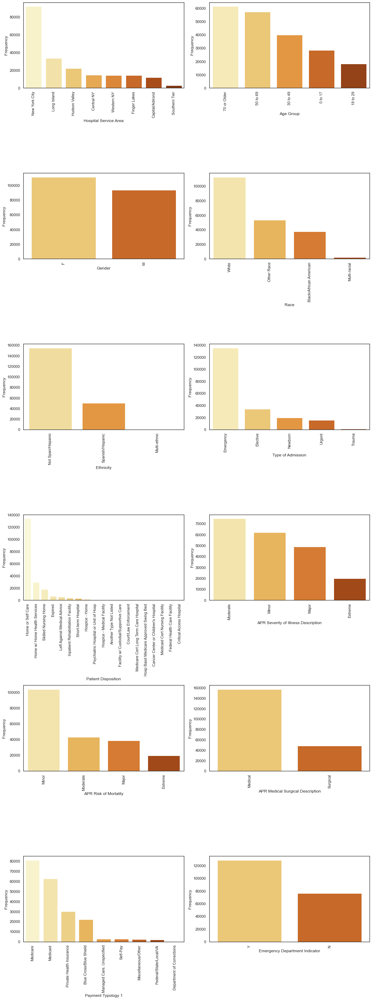

In [427]:
rows = 6
columns = 2
index = 1
plt.figure(figsize=(15,40))
sns.set(style='white')
for i in cat_cols:
    plt.subplot(rows,columns,index)
    sns.countplot(x=health_data[i],order = health_data[i].value_counts().index,palette="YlOrBr")
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)
    index +=1
plt.tight_layout()
plt.show()
    

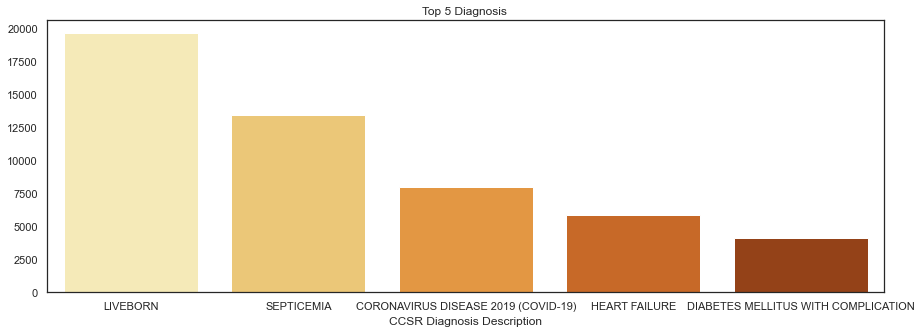

In [428]:
plt.figure(figsize=(15,5))
sns.barplot(x =health_data['CCSR Diagnosis Description'].value_counts()[:5].index,y= health_data['CCSR Diagnosis Description'].value_counts()[:5].values,palette="YlOrBr" )
plt.title('Top 5 Diagnosis ')
plt.show()

**Inference:**
1. No of patients are quietly more in New York city than other cities.
2. More number of patients fall in the age category 70 years or older.
3. Female patients are more in number as comapre to male patients.
4. Patients enrolled in Emergency are huge in number.
5. Patient Disposition i.e. patients destination after discharge, mostly are in Home or Self Care prescription.
6. Mostly patients have Minor Risk of Mortality.
7. Patients have Medicare payment typology more.
8. Top 5 Diagnosis in which maximum number of patients admitted.

<h3>b. Univariate Analysis - Numerical</h3>

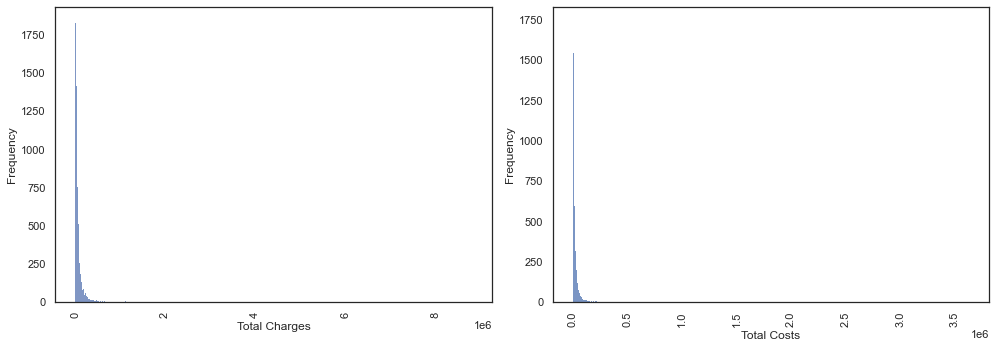

In [430]:
rows = 1
columns = 2
index = 1
plt.figure(figsize=(14,5))
# sns.set(style='darkgrid')
for i in ['Total Charges','Total Costs']:
    plt.subplot(rows,columns,index)
    sns.histplot(health_data[i][0:30000])
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)
    index +=1
plt.tight_layout()
plt.show()

**Inference : From above plot we can see that Total charges and Total Costs have are positively skewed. Will transform the data in later steps to reduce the impact of skewed data.**

<h3>c. Bivariate Analysis - Numerical vs Target Variable(Length of Stay)</h3>

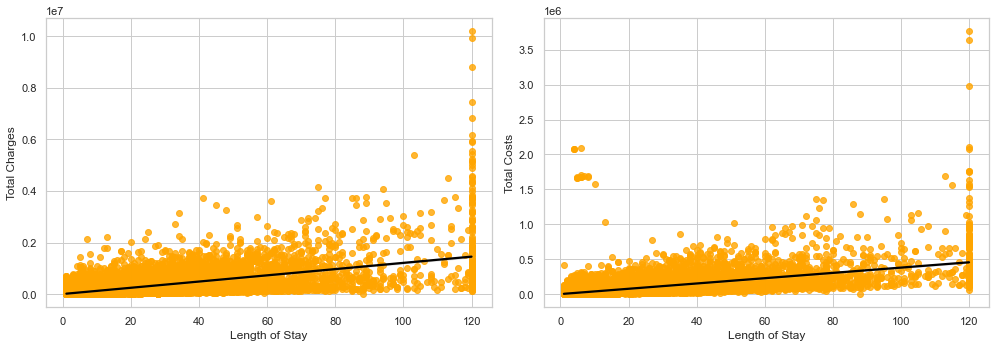

In [431]:
rows = 1
columns = 2
index = 1
plt.figure(figsize = (14,5))
sns.set_style('whitegrid')
for i in ['Total Charges','Total Costs']:
    plt.subplot(rows,columns,index)
    sns.regplot(x=health_data['Length of Stay'],y=health_data[i],data=health_data[0:30000],scatter_kws={"color": "orange"}, line_kws={"color": "black"})
    index +=1
plt.tight_layout()
plt.show()

**Inference : From above plot we can see that Total charges and Total Costs have significance positive relation.**

<h3>d. Bivariate Analysis - Numerical vs Categorical Variable(Length of Stay)</h3>

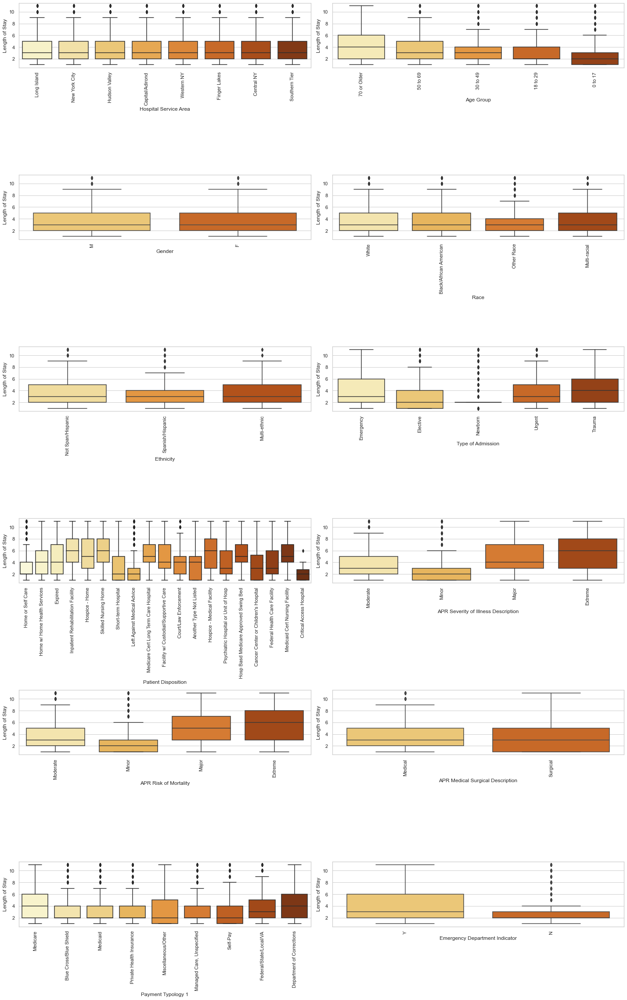

In [432]:
rows = 7
columns = 2
index = 1
plt.figure(figsize=(20,35))
for i in cat_cols:
    plt.subplot(rows,columns,index)
    q1=health_data['Length of Stay'].quantile(.25)
    q3=health_data['Length of Stay'].quantile(.75)
    iqr=q3-q1
    sns.boxplot(x=health_data[i],y=health_data['Length of Stay'][health_data['Length of Stay']<q3+1.5*iqr],palette="YlOrBr",data=health_data[0:10000])
    plt.xticks(rotation = 90)
    index +=1
plt.tight_layout()
plt.show()

**Inferences:**

**Above analysis of length of stay with our categorical variables tells us that:**
1. Children aged upto 17 years have the shortest lengths of stay.
2. Length of stay for newborns is usually 2 days.
3. Patients disposed to home care or critical access hospitals after discharge, and patients leaving against medical advice stay the shortest.
4. Patients disposed to nursing homes, rehabilitation facilities or long term care hospitals usually stay longer.
5. People with least severe ailments have lowest lengths of stay while people with extremely severe illnesses have the highest.
6. Similarly, people with a low risk of mortality have shortest stays.
7. Patients admitted in an emergency have higher lengths of stay than otherwise.

<h3>e. Multivariate Analysis </h3>

In [433]:
cols = ['Age Group','Race','Ethnicity','Type of Admission','Patient Disposition',
        'APR Risk of Mortality','APR Medical Surgical Description','Payment Typology 1']

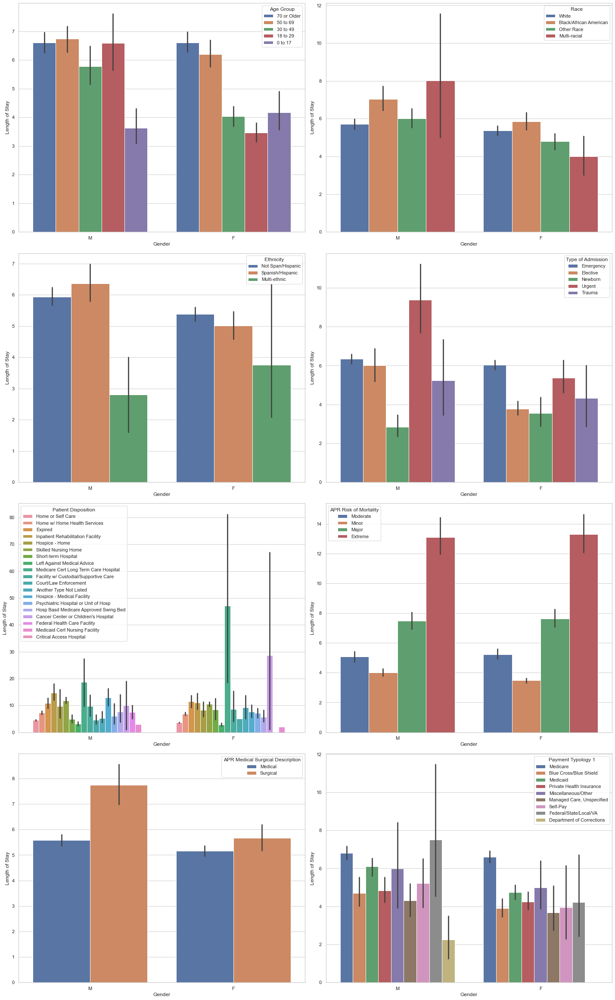

In [434]:
index =1
plt.figure(figsize=(20, 40))
sns.set_style('whitegrid')
for i in cols:
    plt.subplot(5,2,index)
    sns.barplot(x="Gender", y="Length of Stay",hue=health_data[i],data=health_data[0:10000])
    index += 1
plt.tight_layout()
# plt.ylim(0,120)
plt.show()

**Inference:**
1. Males of each group above 0 to 17 are staying more as compare to females.
2. Multi-racial and Multi-ethnic patients stays longer, not much affect of gender.
3. Patients admitted as Trauma, Emergency, and Urgent catefgory have longer stay.
4. Cancer Center or Chidren Hospital Females stayed longer than men on the same prescription.
5. Male with surgical description had longer stay than female in the same.
6. Patients who opted for Payment Typolology Medicare or Medicaid stayed longer in the hospital.

In [440]:
health_data.head()

,Hospital Service Area,Hospital County,Permanent Facility Id,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Code,APR DRG Description,APR MDC Code,APR MDC Description,APR Severity of Illness Code,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Emergency Department Indicator,Total Charges,Total Costs
0,Long Island,Nassau,527.0,Mount Sinai South Nassau,70 or Older,115.0,M,White,Not Span/Hispanic,1,Emergency,Home or Self Care,GEN006,OTHER SPECIFIED AND UNSPECIFIED DISEASES OF KI...,URN003,URETER AND OTHER URINARY TRACT DILATION,465,URINARY STONES AND ACQUIRED UPPER URINARY TRAC...,11,DISEASES AND DISORDERS OF THE KIDNEY AND URINA...,2,Moderate,Moderate,Medical,Medicare,Y,44700.74,5665.27
1,Long Island,Suffolk,913.0,Huntington Hospital,70 or Older,117.0,F,Black/African American,Not Span/Hispanic,3,Emergency,Home or Self Care,DIG004,ESOPHAGEAL DISORDERS,GIS001,ESOPHAGOGASTRODUODENOSCOPY (EGD) WITH BIOPSY,243,OTHER ESOPHAGEAL DISORDERS,6,DISEASES AND DISORDERS OF THE DIGESTIVE SYSTEM,2,Moderate,Minor,Medical,Medicare,Y,28758.57,7316.03
2,New York City,Richmond,1737.0,Staten Island University Hospital Prince's Bay,50 to 69,103.0,M,White,Spanish/Hispanic,1,Elective,Home w/ Home Health Services,MUS006,OSTEOARTHRITIS,MST006,KNEE ARTHROPLASTY,326,ELECTIVE KNEE JOINT REPLACEMENT,8,DISEASES AND DISORDERS OF THE MUSCULOSKELETAL ...,1,Minor,Minor,Surgical,Medicare,N,49101.93,17500.81
3,New York City,Manhattan,1456.0,Mount Sinai Hospital,50 to 69,999.0,M,White,Not Span/Hispanic,1,Elective,Home or Self Care,CIR017,CARDIAC DYSRHYTHMIAS,MAM009,ELECTROPHYSIOLOGIC STUDIES,175,PERCUTANEOUS CARDIAC INTERVENTION WITHOUT AMI,5,DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM,1,Minor,Minor,Surgical,Blue Cross/Blue Shield,N,78518.48,23299.16
4,New York City,Manhattan,1469.0,Mount Sinai Morningside,50 to 69,100.0,M,Black/African American,Not Span/Hispanic,3,Emergency,Home or Self Care,RSP008,CHRONIC OBSTRUCTIVE PULMONARY DISEASE AND BRON...,ESA004,NON-INVASIVE VENTILATION,140,CHRONIC OBSTRUCTIVE PULMONARY DISEASE,4,DISEASES AND DISORDERS OF THE RESPIRATORY SYSTEM,3,Major,Major,Medical,Medicaid,Y,47718.87,11138.85


ERROR! Session/line number was not unique in database. History logging moved to new session 985


In [ ]:
plt.figure(figsize=(10,7))
sns.heatmap(health_data.corr(),annot=True,fmt='.2f',cmap="YlOrBr")
plt.show()

**Inferences:**
1. From Above plot we can see that Total Charges and Total Costs have strong positive correlation with each other and these two features are also positively correlated with Length of Stay column.
2. APR MDC code and APR DRG Code are also strongly positive correlated but they are more like a serial number.

<a id=9></a>
### 9. Feature Selection and Transformation based on EDA

**a.Transforming the `Total Charges` and `Total Costs` feature using Boxcox Power transformation.**

In [36]:
health_data['Total Charges']=stats.boxcox(health_data['Total Charges'])[0]
health_data['Total Costs']=stats.boxcox(health_data['Total Costs'])[0]

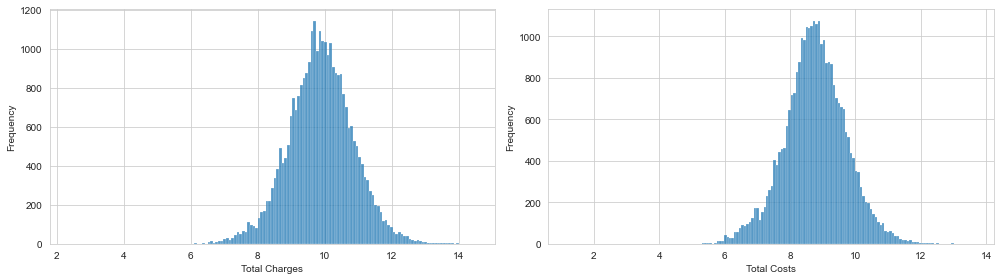

In [345]:
# Visualizing the transformed features
rows = 1
columns = 2
index = 1
plt.figure(figsize=(14,4))
# sns.set(style='darkgrid')
for i in ['Total Charges','Total Costs']:
    plt.subplot(rows,columns,index)
    sns.histplot(health_data[i][0:30000])
    plt.ylabel('Frequency')
    index +=1
plt.tight_layout()
plt.show()

**Inference : From above plot we can see that data has become normally distributed after applying transformation**

**b. Dropping redundant columns**

**On inspection, we found there are redundant columns with its code and name dropping one of them among these columns, more clear analysis has been made in the below steps:**

In [346]:
print(f"Number of Hospital County: {health_data['Hospital County'].nunique()}")
print(f"Number of Zip Code - 3 digits: {health_data['Zip Code - 3 digits'].nunique()}")

Number of Hospital County: 56
Number of Zip Code - 3 digits: 50


In [347]:
print(f"Number of Permanent Facility Id: {health_data['Permanent Facility Id'].nunique()}")
print(f"Number of Facility Name: {health_data['Facility Name'].nunique()}")

Number of Permanent Facility Id: 199
Number of Facility Name: 198


In [348]:
print(f"Number of CCSR Diagnosis Code: {health_data['CCSR Diagnosis Code'].nunique()}")
print(f"Number of CCSR Diagnosis Description: {health_data['CCSR Diagnosis Description'].nunique()}")

Number of CCSR Diagnosis Code: 437
Number of CCSR Diagnosis Description: 437


In [349]:
print(f"Number of CCSR Procedure Code: {health_data['CCSR Procedure Code'].nunique()}")
print(f"Number of CCSR Procedure Description: {health_data['CCSR Procedure Description'].nunique()}")

Number of CCSR Procedure Code: 315
Number of CCSR Procedure Description: 315


In [350]:
print(f"Number of APR DRG Code: {health_data['APR DRG Code'].nunique()}")
print(f"Number of APR DRG Description: {health_data['APR DRG Description'].nunique()}")

Number of APR DRG Code: 324
Number of APR DRG Description: 324


In [351]:
print(f"Number of APR MDC Code: {health_data['APR MDC Code'].nunique()}")
print(f"Number of APR MDC Description: {health_data['APR MDC Description'].nunique()}")

Number of APR MDC Code: 24
Number of APR MDC Description: 24


In [352]:
print(f"Number of APR Severity of Illness Code: {health_data['APR Severity of Illness Code'].nunique()}")
print(f"Number of APR Severity of Illness Description: {health_data['APR Severity of Illness Description'].nunique()}")

Number of APR Severity of Illness Code: 4
Number of APR Severity of Illness Description: 4


In [37]:
health_data_original = health_data.copy()

**Dropping Facility Name,CCSR Diagnosis Description,CCSR Procedure Description,APR DRG Description,APR MDC Description columns as they are forming redundancy.**


In [38]:
health_data.drop(['Facility Name','CCSR Diagnosis Description','CCSR Procedure Description',
                  'APR DRG Description','APR MDC Description','APR Severity of Illness Description'], axis=1,inplace=True)  

In [39]:
health_data_class = health_data.copy()

<a id=10></a>
### 10. Feature Encoding and Converting datatype to numeric for ML

**Using Target, Label Encoding, and One Hot Encoding for converting categorical columns to numerical to ease the modeling on the dataset.**

In [259]:
# Applying Target Encoding on ['Hospital Service Area','Hospital County','Type of Admission','Patient Disposition',
# 'CCSR Procedure Code'] columns
for i in ['Hospital Service Area','Hospital County','Type of Admission','Patient Disposition',
          'CCSR Procedure Code']:
    health_data[i]=health_data[i].map(dict(health_data.groupby(i)['Length of Stay'].mean()))
    
    
# Applying label encoding in Diagnosis code columns     
health_data['Age Group']=LabelEncoder().fit_transform(health_data['Age Group'])
health_data['CCSR Diagnosis Code']=LabelEncoder().fit_transform(health_data['CCSR Diagnosis Code'])


# Mapping the values of APR Risk of Mortality and Payment Typology 1 to integer values
health_data['APR Risk of Mortality']=health_data['APR Risk of Mortality'].map({'Minor':0,'Moderate':1,'Major':2,
                                                           'Extreme':3})
health_data['Payment Typology 1']=health_data['Payment Typology 1'].map(dict(health_data['Payment Typology 1']
                                                         .value_counts()/len(health_data)))

# Applying One hot encoding to the Race, Ethnicity, APR Medical Surgical, Emergency Department Indicator
health_data=pd.get_dummies(health_data,drop_first=True)
health_data.head()

,Hospital Service Area,Hospital County,Permanent Facility Id,Age Group,Zip Code - 3 digits,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Procedure Code,APR DRG Code,APR MDC Code,APR Severity of Illness Code,APR Risk of Mortality,Payment Typology 1,Total Charges,Total Costs,Gender_M,Race_Multi-racial,Race_Other Race,Race_White,Ethnicity_Not Span/Hispanic,Ethnicity_Spanish/Hispanic,APR Medical Surgical Description_Surgical,Emergency Department Indicator_Y
0,5.291897,5.346636,527.0,4,115.0,1,6.255457,4.199502,115,4.569248,465,11,2,1,0.395502,10.015244,8.136358,True,False,False,True,True,False,False,True
1,5.291897,5.228493,913.0,4,117.0,3,6.255457,4.199502,51,4.864360,243,6,2,0,0.395502,9.628906,8.362329,False,False,False,False,True,False,False,True
2,5.860162,5.025930,1737.0,3,103.0,1,4.468586,6.999052,241,2.685249,326,8,1,0,0.395502,10.097225,9.126967,True,False,False,True,False,True,True,False
3,5.860162,5.825071,1456.0,3,999.0,1,4.468586,4.199502,26,3.785714,175,5,1,0,0.107008,10.505581,9.375810,True,False,False,True,True,False,True,False
4,5.860162,5.825071,1469.0,3,100.0,3,6.255457,4.199502,404,5.944540,140,4,3,2,0.304881,10.072292,8.732042,True,False,False,False,True,False,False,True


In [260]:
health_data.dtypes

Hospital Service Area                        float64
Hospital County                              float64
Permanent Facility Id                        float64
Age Group                                      int32
Zip Code - 3 digits                          float64
Length of Stay                                 int32
Type of Admission                            float64
Patient Disposition                          float64
CCSR Diagnosis Code                            int32
CCSR Procedure Code                          float64
APR DRG Code                                   int64
APR MDC Code                                   int64
APR Severity of Illness Code                   int64
APR Risk of Mortality                          int64
Payment Typology 1                           float64
Total Charges                                float64
Total Costs                                  float64
Gender_M                                        bool
Race_Multi-racial                             

**All of the data types are in integer hence, appropriate to move forward for modeling.**

<a id=11></a>
### 11. Regression Problem Statement for Length of Stay


### 11.1 Scaling, Spliting the dataset and performing Regression Models

**Using Standard Scaler to perform scaling on Total Charges and Total Costs (numerical columns)** 

In [261]:
health_data_scaled=health_data.copy()
health_data_scaled.head()

,Hospital Service Area,Hospital County,Permanent Facility Id,Age Group,Zip Code - 3 digits,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Procedure Code,APR DRG Code,APR MDC Code,APR Severity of Illness Code,APR Risk of Mortality,Payment Typology 1,Total Charges,Total Costs,Gender_M,Race_Multi-racial,Race_Other Race,Race_White,Ethnicity_Not Span/Hispanic,Ethnicity_Spanish/Hispanic,APR Medical Surgical Description_Surgical,Emergency Department Indicator_Y
0,5.291897,5.346636,527.0,4,115.0,1,6.255457,4.199502,115,4.569248,465,11,2,1,0.395502,10.015244,8.136358,True,False,False,True,True,False,False,True
1,5.291897,5.228493,913.0,4,117.0,3,6.255457,4.199502,51,4.864360,243,6,2,0,0.395502,9.628906,8.362329,False,False,False,False,True,False,False,True
2,5.860162,5.025930,1737.0,3,103.0,1,4.468586,6.999052,241,2.685249,326,8,1,0,0.395502,10.097225,9.126967,True,False,False,True,False,True,True,False
3,5.860162,5.825071,1456.0,3,999.0,1,4.468586,4.199502,26,3.785714,175,5,1,0,0.107008,10.505581,9.375810,True,False,False,True,True,False,True,False
4,5.860162,5.825071,1469.0,3,100.0,3,6.255457,4.199502,404,5.944540,140,4,3,2,0.304881,10.072292,8.732042,True,False,False,False,True,False,False,True


### 11.2 Performing OLS Linear Regression 

**Assumptions before performing Linear Regression** 
1. Target Variable should be numeric.
2.  Predictors must not show multicollinearity.


**Inference: The output shows that the variable `Hospital Service Area` has the highest VIF. Removing  this feature from the dataset and set the threshold of VIF as to 10, it means considering feature having VIF less than or equal to 10 (can be changed as per business requirement)**.

In [262]:
# Dropping Hospital Service Area
health_data_scaled.drop('Hospital Service Area',axis=1,inplace=True)

# # create an empty dataframe to store the VIF for each variable
# vif = pd.DataFrame()

# # Features name
# vif["Features"] = health_data_scaled.columns

# # Calculate VIF of each features
# vif["VIF_Factor"] = [variance_inflation_factor(health_data_scaled.values, i) for i in range(health_data_scaled.shape[1])]

# vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

**Inference: The output shows that the variable `Ethnicity_Not Span/Hispanic` has the highest VIF. Removing  this feature from the dataset**.

In [263]:
# Dropping Ethnicity_Not Span/Hispanic
health_data_scaled.drop('Ethnicity_Not Span/Hispanic',axis=1,inplace=True)

# # create an empty dataframe to store the VIF for each variable
# vif = pd.DataFrame()

# # Features name
# vif["Features"] = health_data_scaled.columns

# # Calculate VIF of each features
# vif["VIF_Factor"] = [variance_inflation_factor(health_data_scaled.values, i) for i in range(health_data_scaled.shape[1])]

# vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

**Inference: The output shows that the variable `Type of Admission` has the highest VIF. Removing  this feature from the dataset**.

In [264]:
# Dropping Type of Admission
health_data_scaled.drop('Type of Admission',axis=1,inplace=True)

# # create an empty dataframe to store the VIF for each variable
# vif = pd.DataFrame()

# # Features name
# vif["Features"] = health_data_scaled.columns

# # Calculate VIF of each features
# vif["VIF_Factor"] = [variance_inflation_factor(health_data_scaled.values, i) for i in range(health_data_scaled.shape[1])]

# vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

**Inference: The output shows that the variable `APR MDC Code` has the highest VIF. Removing  this feature from the dataset.**

In [265]:
health_data_scaled.drop('APR MDC Code',axis=1,inplace=True)
# create an empty dataframe to store the VIF for each variable
# vif = pd.DataFrame()

# # Features name
# vif["Features"] = health_data_scaled.columns

# # Calculate VIF of each features
# vif["VIF_Factor"] = [variance_inflation_factor(health_data_scaled.values, i) for i in range(health_data_scaled.shape[1])]

# vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

**Inference: The output shows that the variable `Hospital County` has the highest VIF. Removing  this feature from the dataset**.

In [266]:
health_data_scaled.drop('Hospital County',axis=1,inplace=True)
# create an empty dataframe to store the VIF for each variable
# vif = pd.DataFrame()

# # Features name
# vif["Features"] = health_data_scaled.columns

# # Calculate VIF of each features
# vif["VIF_Factor"] = [variance_inflation_factor(health_data_scaled.values, i) for i in range(health_data_scaled.shape[1])]

# vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

**Inference: The output shows that the variable `APR Severity of Illness Code` has the highest VIF. Removing  this feature from the dataset**.

In [267]:
health_data_scaled.drop('APR Severity of Illness Code',axis=1,inplace=True)
# create an empty dataframe to store the VIF for each variable
# vif = pd.DataFrame()

# # Features name
# vif["Features"] = health_data_scaled.columns

# # Calculate VIF of each features
# vif["VIF_Factor"] = [variance_inflation_factor(health_data_scaled.values, i) for i in range(health_data_scaled.shape[1])]

# vif.sort_values('VIF_Factor', ascending = False).reset_index(drop = True)

**Using Ordinary Least Square to build the Linear Regression Model as Assumptions before modeling fulfilled.**

In [268]:
# Defining X and y Dataset for modeling
# sm.add_constant adds the intercept to the model
X = sm.add_constant(health_data_scaled.drop('Length of Stay',axis =1))
y = health_data_scaled['Length of Stay']

# Spliting into test and train
X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.7,random_state=1)
linreg_model = sm.OLS(y_train,X_train.astype(float)).fit()
linreg_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Length of Stay   R-squared:                       0.470
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     7086.
Date:                Sun, 11 Jun 2023   Prob (F-statistic):               0.00
Time:                        14:07:42   Log-Likelihood:            -4.6122e+05
No. Observations:              143606   AIC:                         9.225e+05
Df Residuals:                  143587   BIC:                         9.227e+05
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
=============================================================================================================
                                                coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------
const                                       -47.0592      0.214   -219.409      0.000     -47.480     -46.639
Permanent Facility Id                        -0.0009   2.56e-05    -33.371      0.000      -0.001      -0.001
Age Group                                    -0.9224      0.017    -55.212      0.000      -0.955      -0.890
Zip Code - 3 digits                          -0.0007      0.000     -6.592      0.000      -0.001      -0.001
Patient Disposition                           0.3620      0.007     50.283      0.000       0.348       0.376
CCSR Diagnosis Code                           0.0027      0.000     20.134      0.000       0.002       0.003
CCSR Procedure Code                           0.4860      0.005     94.312      0.000       0.476       0.496
APR DRG Code                                  0.0024   7.18e-05     33.620      0.000       0.002       0.003
APR Risk of Mortality                         0.2704      0.020     13.383      0.000       0.231       0.310
Payment Typology 1                            1.7085      0.151     11.320      0.000       1.413       2.004
Total Charges                                 1.6253      0.038     43.070      0.000       1.551       1.699
Total Costs                                   3.8931      0.039    100.744      0.000       3.817       3.969
Gender_M                                      0.2132      0.032      6.564      0.000       0.150       0.277
Race_Multi-racial                             0.0074      0.172      0.043      0.966      -0.329       0.344
Race_Other Race                              -0.2320      0.053     -4.372      0.000      -0.336      -0.128
Race_White                                    0.0972      0.044      2.191      0.028       0.010       0.184
Ethnicity_Spanish/Hispanic                   -0.2087      0.044     -4.724      0.000      -0.295      -0.122
APR Medical Surgical Description_Surgical    -3.2707      0.045    -72.216      0.000      -3.359      -3.182
Emergency Department Indicator_Y             -0.8678      0.040    -21.854      0.000      -0.946      -0.790
==============================================================================
Omnibus:                   167403.115   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         30276888.963
Skew:                           6.001   Prob(JB):                         0.00
Kurtosis:                      73.114   Cond. No.                     1.78e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.78e+04. This might indicate that there are
strong mu

**Interpretation:** The R-squared value obtained from this model is 46.8% which means that the above model explains a 46.8% of the variation in the Total_Compensation.<br> 

The `Durbin-Watson` test is used to check the autocorrelation between the residuals.

If the Durbin-Watson test statistic is near to 2: no autocorrelation<br>
If the Durbin-Watson test statistic is between 0 and 2: positive autocorrelation <br>
If the Durbin-Watson test statistic is between 2 and 4: negative autocorrelation

The summary output shows that the value of the test statistic is near to 2 (= 2.001) which means there is no autocorrelation.

The `Jarque-Bera` test is used to check the normality of the residuals. Here, the p-value of the test is less than 0.05; that implies the residuals are not normally distributed.

Also, the 'Cond. No' (1.37e+04) represents the `Condition Number (CN)` that is used to check the multicollinearity. 

If CN < 100: no multicollinearity.<br> 
If CN is between 100 and 1000: moderate multicollinearity<br>
If CN > 1000: severe multicollinearity

Thus, it can be seen that there is multicollinearity in the data.

**Finding the variables having p_value less than 0.05, termed as insignificant variable**

In [269]:
linreg_model.pvalues>0.05

const                                        False
Permanent Facility Id                        False
Age Group                                    False
Zip Code - 3 digits                          False
Patient Disposition                          False
CCSR Diagnosis Code                          False
CCSR Procedure Code                          False
APR DRG Code                                 False
APR Risk of Mortality                        False
Payment Typology 1                           False
Total Charges                                False
Total Costs                                  False
Gender_M                                     False
Race_Multi-racial                             True
Race_Other Race                              False
Race_White                                   False
Ethnicity_Spanish/Hispanic                   False
APR Medical Surgical Description_Surgical    False
Emergency Department Indicator_Y             False
dtype: bool

In [270]:
# Dropping Race_Multi-racial and  building the model again
# Defining X and y Dataset for modeling
# sm.add_constant adds the intercept to the model
X = sm.add_constant(health_data_scaled.drop(columns=['Length of Stay','Race_Multi-racial'],axis =1))
y = health_data_scaled['Length of Stay']

# Spliting into test and train
X_train,X_test,y_train,y_test =train_test_split(X,y,train_size=0.7,random_state=1)

# Fitting the model using OLS S
linreg_model = sm.OLS(y_train,X_train.astype(float)).fit()
linreg_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:         Length of Stay   R-squared:                       0.470
Model:                            OLS   Adj. R-squared:                  0.470
Method:                 Least Squares   F-statistic:                     7503.
Date:                Sun, 11 Jun 2023   Prob (F-statistic):               0.00
Time:                        14:07:43   Log-Likelihood:            -4.6122e+05
No. Observations:              143606   AIC:                         9.225e+05
Df Residuals:                  143588   BIC:                         9.227e+05
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
=============================================================================================================
                                                coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------
const                                       -47.0589      0.214   -219.572      0.000     -47.479     -46.639
Permanent Facility Id                        -0.0009   2.56e-05    -33.373      0.000      -0.001      -0.001
Age Group                                    -0.9224      0.017    -55.213      0.000      -0.955      -0.890
Zip Code - 3 digits                          -0.0007      0.000     -6.592      0.000      -0.001      -0.001
Patient Disposition                           0.3620      0.007     50.284      0.000       0.348       0.376
CCSR Diagnosis Code                           0.0027      0.000     20.137      0.000       0.002       0.003
CCSR Procedure Code                           0.4860      0.005     94.312      0.000       0.476       0.496
APR DRG Code                                  0.0024   7.18e-05     33.621      0.000       0.002       0.003
APR Risk of Mortality                         0.2704      0.020     13.383      0.000       0.231       0.310
Payment Typology 1                            1.7085      0.151     11.320      0.000       1.413       2.004
Total Charges                                 1.6253      0.038     43.079      0.000       1.551       1.699
Total Costs                                   3.8930      0.039    100.774      0.000       3.817       3.969
Gender_M                                      0.2132      0.032      6.564      0.000       0.150       0.277
Race_Other Race                              -0.2324      0.052     -4.449      0.000      -0.335      -0.130
Race_White                                    0.0969      0.044      2.221      0.026       0.011       0.182
Ethnicity_Spanish/Hispanic                   -0.2086      0.044     -4.729      0.000      -0.295      -0.122
APR Medical Surgical Description_Surgical    -3.2707      0.045    -72.225      0.000      -3.359      -3.182
Emergency Department Indicator_Y             -0.8678      0.040    -21.855      0.000      -0.946      -0.790
==============================================================================
Omnibus:                   167403.262   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         30277060.537
Skew:                           6.001   Prob(JB):                         0.00
Kurtosis:                      73.114   Cond. No.                     1.78e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.78e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

**Interpretation: Every feature has pvalue less than 0.05 it mean features are significant in model building.**

### Assumptions of MLR Model 

Now, use the model with significant variabels to check some of the assumptions based on the residuals of linear regression:

1. Linear Relationship Between Dependent and Independent Variable
2. Autocorrelation
3. Heteroscedasticity
4. Tests of Normality

**1. Linear Relationship between Dependent and Independent Variable**

An assumption of linear regression is that it should be linear in the parameter. To check the linearity we plot a graph of residuals and each independent variable. If the plot shows no specific pattern then we can conclude the presence of linearity.

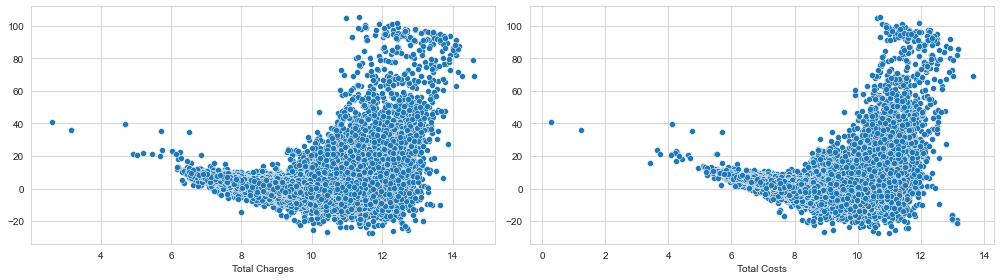

In [271]:
# Visualizing the transformed features
rows = 1
columns = 2
index = 1
plt.figure(figsize=(14,4))
# sns.set(style='darkgrid')
for i in ['Total Charges','Total Costs']:
    plt.subplot(rows,columns,index)
    sns.scatterplot(x=health_data_scaled[i], y=linreg_model.resid )
    index +=1
plt.tight_layout()
plt.show()

**Interpretation:** The above plots show no specific pattern, implies that there is a linearity present in the data.

**2. Autocorrelation**

From the above summary, we can observe that the value obtained from the Durbin-Watson test statistic is close to 2 (= 2.001). Thus, we conclude that there is no autocorrelation.

**3. Heteroscedasticity**

Breusch-Pagan is one of the tests for detecting heteroskedasticity in the residuals.<br>
The test hypothesis for the Breusch-Pagan test is given as:
<p><strong> H<sub>o</sub>:  There is homoscedasticity present in the data </strong> 
<p><strong> H<sub>1</sub>:  There is a heteroscedasticity present in the data </strong> 

In [272]:
test = list(het_breuschpagan(linreg_model.resid, linreg_model.model.exog))
print(f'p_value: {test[3]} ')


p_value: 0.0 


**Interpretation:** We observe that the p-value is less than 0.05 thus, we conclude that there is heteroskedasticity present in the data.

**4. Test of Normality**

<Figure size 864x720 with 0 Axes>

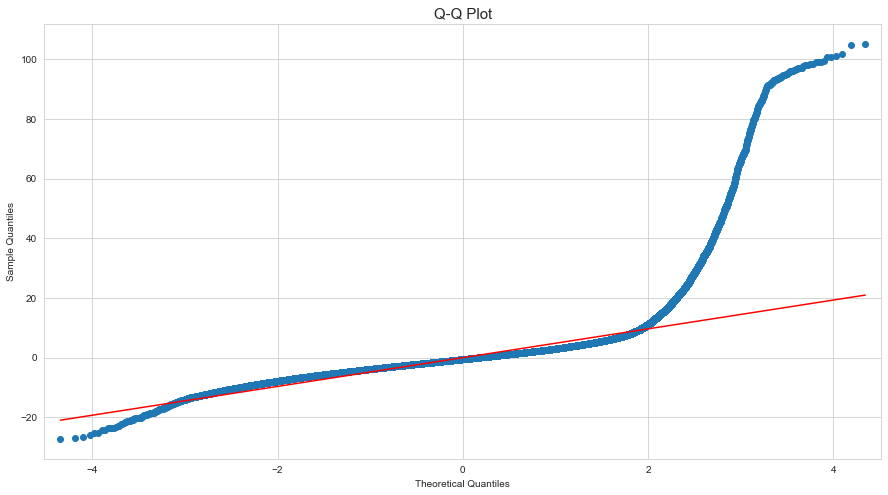

In [273]:

plt.figure(figsize=(12,10))
qqplot(linreg_model.resid, line = 'r')

plt.title('Q-Q Plot', fontsize = 15)
plt.xlabel('Theoretical Quantiles', fontsize = 10)
plt.ylabel('Sample Quantiles', fontsize = 10)

plt.show()

**Interpretation:** The diagonal line (red line) is the regression line and the blue points are the cumulative distribution of the residuals. As some of the points are away from the diagonal line, we conclude that the residuals do not follow a normal distribution.


###  Model Evaluation and Performance

As R2 and Adj R2 are 0.472 anf pvalue of F-statistic is 0.00 which is less than 0.05, the model is significant.

In [274]:
y_train_pred = linreg_model.predict(X_train)
y_test_pred = linreg_model.predict(X_test)

**Mean Squared error**

In [275]:
mse_train = round(mean_squared_error(y_train, y_train_pred),4)

# MSE for the training set
print(f'Mean Squared Error on training set: {mse_train}')
mse_test = round(mean_squared_error(y_test, y_test_pred),4)

#for the test set
print(f'Mean Squared Error on test set: {mse_test}')

Mean Squared Error on training set: 36.0737
Mean Squared Error on test set: 35.4026


**Root Mean Squared Error (RMSE)**

In [276]:
rmse_train = round(np.sqrt(mean_squared_error(y_train, y_train_pred)),4)

# MSE for the training set
print(f'Root Mean Squared Error on training set: {rmse_train}')
rmse_test = round(np.sqrt(mean_squared_error(y_test, y_test_pred)),4)

#for the test set
print(f'Root Mean Squared Error on test set: {rmse_test}')

Root Mean Squared Error on training set: 6.0061
Root Mean Squared Error on test set: 5.95


We can see the linear regression model with `R2 - 0.468` does not perform really well. 

### 11.3 Building model for other Regression Algorithms

In [277]:
# Buiding Models for nine Regressor Algorithms
models = []
models.append(['Linear Regreesion', LinearRegression()])
models.append(['Lasso regression', Lasso(alpha = 0.01, max_iter = 5)])
models.append(['Ridge Regression', Ridge(alpha = 1, max_iter = 5)])
models.append(['SGDRegressor',SGDRegressor(random_state=10)])
models.append(['KNeighbors', KNeighborsRegressor(n_neighbors=5)])
models.append(['Decision Tree', DecisionTreeRegressor(max_depth=4,random_state=10)])
models.append(['Random Forest', RandomForestRegressor(max_depth=4,random_state=10)])
models.append(['Adaboost', AdaBoostRegressor(base_estimator=DecisionTreeRegressor(max_depth=4,random_state=10))])
models.append(['XGBoost', XGBRegressor(max_depth =3)])

lst_1= []
for m in range(len(models)):
    lst_2= []
    model = models[m][1]
    model.fit(X_train,y_train)   
    y_pred = model.predict(X_test)
    
    
    rmse = np.sqrt(mean_squared_error(y_test, y_pred)) 
    mse = mean_squared_error(y_test, y_pred)  
    mape = mean_absolute_percentage_error(y_test, y_pred)  
    lst_2.append(models[m][0])
    lst_2.append((r2_score(y_test, y_pred))) 
    lst_2.append(mse)
    lst_2.append(rmse)
    lst_2.append(mape)
    
    lst_1.append(lst_2)

In [278]:
# Creating the dataframe for all the classifiers with their respective metrics
df = pd.DataFrame(lst_1, columns= ['Model', 'R2-score',  'MSE', 'RMSE', 'MAPE'])


df.sort_values(by= ['R2-score'], inplace= True, ascending= False)
df

,Model,R2-score,MSE,RMSE,MAPE
8,XGBoost,8.186505e-01,1.215737e+01,3.486742e+00,4.257394e-01
6,Random Forest,6.470432e-01,2.366165e+01,4.864324e+00,6.569270e-01
5,Decision Tree,6.224458e-01,2.531062e+01,5.030966e+00,6.808814e-01
2,Ridge Regression,4.719058e-01,3.540257e+01,5.950006e+00,1.097963e+00
0,Linear Regreesion,4.719058e-01,3.540257e+01,5.950006e+00,1.097971e+00
1,Lasso regression,4.621198e-01,3.605861e+01,6.004882e+00,1.143252e+00
4,KNeighbors,3.842834e-01,4.127663e+01,6.424689e+00,7.520471e-01
7,Adaboost,3.817232e-01,4.144826e+01,6.438032e+00,1.881566e+00
3,SGDRegressor,-8.924664e+26,5.982949e+28,2.446007e+14,7.957311e+13


### 11.4 Performing GridSearchCV

In [279]:
tuned_parameters= {'max_depth': [3,5,6,7,9],
            'learning_rate': [0.1,0.01,0.03,0.5],
                  'n_estimators':[50,100,150]}

In [280]:
st = time.time()
Xgb_gscv = GridSearchCV(estimator=XGBRegressor(),param_grid=tuned_parameters,scoring='r2',verbose=True)
Xgb_gscv.fit(X_train,y_train)
print(Xgb_gscv.best_params_)

et =time.time()
print(f'Time taken: {et -st}')

Fitting 5 folds for each of 60 candidates, totalling 300 fits
{'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 150}
Time taken: 4735.430693864822


In [281]:
building_model(XGBRegressor(max_depth = 9,learning_rate=0.1,n_estimators= 150),X_train,X_test,y_train,y_test)

R2 score on test data:  0.8826877047414584
R2 score on train data:  0.9669929749952731
RMSE Traning: 1.4995
RMSE Testing: 2.8044
MSE: 7.8644241941773485


In [282]:
building_model(XGBRegressor(max_depth = 7,learning_rate=0.03,n_estimators= 150),X_train,X_test,y_train,y_test)

R2 score on test data:  0.845361880942902
R2 score on train data:  0.889489995935017
RMSE Traning: 2.7437
RMSE Testing: 3.2197
MSE: 10.366686306618575


**Inferences:**

1. The overall R2 score for training and testing data are close which suggests that there is `no major overfitting` of the model.
2. The R2 score for the testing data suggests that the model `correctly predicts about 84.5% records of unseen data`. 


<a id=12></a>
### 12. Classification Problem Statement for Risk of Mortality

We shall now proceed with the prediction of `Risk of Mortality` of a patient through classification.

In [356]:
health_data_class.head()

,Hospital Service Area,Hospital County,Permanent Facility Id,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Procedure Code,APR DRG Code,APR MDC Code,APR Severity of Illness Code,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Emergency Department Indicator,Total Charges,Total Costs
0,Long Island,Nassau,527.0,70 or Older,115.0,M,White,Not Span/Hispanic,1,Emergency,Home or Self Care,GEN006,URN003,465,11,2,Moderate,Medical,Medicare,Y,10.015244,8.136358
1,Long Island,Suffolk,913.0,70 or Older,117.0,F,Black/African American,Not Span/Hispanic,3,Emergency,Home or Self Care,DIG004,GIS001,243,6,2,Minor,Medical,Medicare,Y,9.628906,8.362329
2,New York City,Richmond,1737.0,50 to 69,103.0,M,White,Spanish/Hispanic,1,Elective,Home w/ Home Health Services,MUS006,MST006,326,8,1,Minor,Surgical,Medicare,N,10.097225,9.126967
3,New York City,Manhattan,1456.0,50 to 69,999.0,M,White,Not Span/Hispanic,1,Elective,Home or Self Care,CIR017,MAM009,175,5,1,Minor,Surgical,Blue Cross/Blue Shield,N,10.505581,9.375810
4,New York City,Manhattan,1469.0,50 to 69,100.0,M,Black/African American,Not Span/Hispanic,3,Emergency,Home or Self Care,RSP008,ESA004,140,4,3,Major,Medical,Medicaid,Y,10.072292,8.732042


### Bivariate Analysis

### 12.1 Numerical vs Categorical Target Variable (Risk of Mortality) 

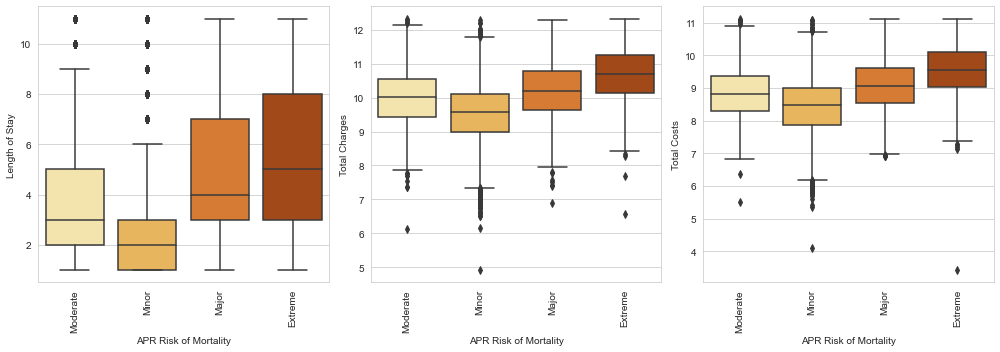

In [357]:


rows = 1
columns = 3
index = 1
plt.figure(figsize = (14,5))
sns.set_style('whitegrid')
for i in ['Length of Stay','Total Charges','Total Costs']:
    plt.subplot(rows,columns,index)
    q1=health_data_class[i].quantile(.25)
    q3=health_data_class[i].quantile(.75)
    iqr=q3-q1
    sns.boxplot(x='APR Risk of Mortality',y=i,palette="YlOrBr",
                data=health_data_class[health_data_class[i]<q3+1.5*iqr][0:10000])
    plt.xticks(rotation = 90)
    index +=1
plt.tight_layout()
plt.show()



    

**Inference:**

Length of stay, total charges and total costs are all higher for higher levels of risk of mortality of a patient.

### 12.2 Categorical vs Categorical Target Variable (Risk of Mortality) 

In [358]:
cat_cols = ['Hospital Service Area','Age Group','Gender',
            'Race','Ethnicity','Type of Admission','Patient Disposition',
          'APR Medical Surgical Description','Payment Typology 1','Emergency Department Indicator']

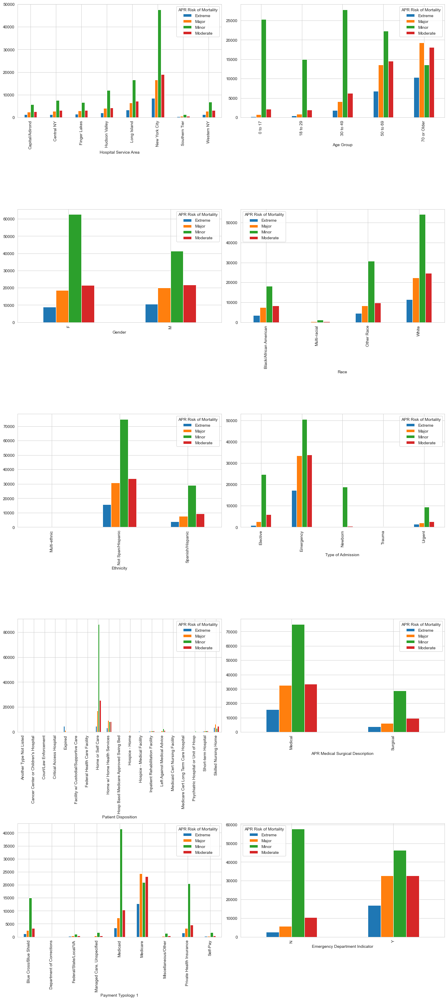

In [359]:
index=1
plt.figure(figsize=(15,45))
sns.set_style('whitegrid')
for i in cat_cols:
    ax=plt.subplot(7,2,index)
    pd.crosstab(health_data_class[i],health_data_class['APR Risk of Mortality']).plot.bar(ax=ax)
    index+=1
plt.tight_layout()
plt.show()

**Inferences:**

1. Patient deaths are equally likely irrespective of the service area of the hospital.
2. Patients aged less than 50 are much less likely to die but those aged 70+ have higher risks of mortality.
3. More females have lower risks of mortality than males.
4. Risk of mortality appears to be  same irrespective of the race and ethnicity of a patient.
5. Electively admitted patients and newborn cases have lesser risk of mortality than other types of admission.
6. Patients with disposition 'Expired' are the most likely to die.
7. Patients disposed to homes are the least likely to die.
8. Risk of mortality is roughly the same for medical and surgical descriptions.
9. 'Medicare' payment typology patients have higher risks of mortality than other typology patients.
10. Patients admitted in an emergency have higher risks of mortality than otherwise.

### 12.3 Checking Balance of the Target Variable

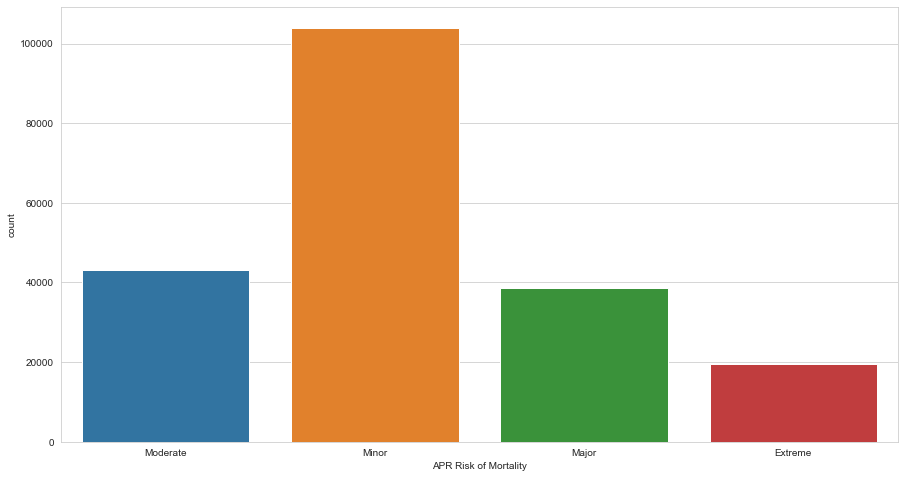

In [360]:
sns.countplot(x=health_data_class['APR Risk of Mortality'])
plt.show()

We can see that our target variable `Risk of Mortality` is imbalanced. There are more records in the data for minor risk class than all other classes. To overcome this imbalance, we shall perform `Synthetic Minority Oversampling Technique (SMOTE)` on the data at a later step.

We shall make a copy of our data in order to interpret the clusters for our third problem statement which involves `clustering`.

In [40]:
health_data_class_original = health_data_class.copy()

### 12.4 Feature Encoding and Converting datatype to numeric for ML

In [41]:
# Mapping the values of APR Risk of Mortality and Payment Typology 1 to integer values
health_data_class['APR Risk of Mortality']=health_data_class['APR Risk of Mortality'].map({'Minor':0,'Moderate':1,'Major':2,
                                                           'Extreme':3})


# Applying Target Encoding on ['Hospital Service Area','Hospital County','Type of Admission','Patient Disposition','CCSR Procedure Code'] columns
for i in ['Hospital Service Area','Type of Admission','Patient Disposition','Age Group','Payment Typology 1']:
    health_data_class[i]=health_data_class[i].map(dict(health_data_class.groupby(i)['APR Risk of Mortality'].mean()))
    
    
# Applying label encoding in Diagnosis code columns 

for i in ['CCSR Diagnosis Code','Hospital County','CCSR Procedure Code']:
    health_data_class[i]=LabelEncoder().fit_transform(health_data_class[i])




# Applying One hot encoding to the Race, Ethnicity, APR Medical Surgical, Emergency Department Indicator
health_data_class=pd.get_dummies(health_data_class,drop_first=True)
health_data_class.head()

,Hospital Service Area,Hospital County,Permanent Facility Id,Age Group,Zip Code - 3 digits,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Procedure Code,APR DRG Code,APR MDC Code,APR Severity of Illness Code,APR Risk of Mortality,Payment Typology 1,Total Charges,Total Costs,Gender_M,Race_Multi-racial,Race_Other Race,Race_White,Ethnicity_Not Span/Hispanic,Ethnicity_Spanish/Hispanic,APR Medical Surgical Description_Surgical,Emergency Department Indicator_Y
0,0.900113,28,527.0,1.429222,115.0,1,1.130421,0.551131,115,305,465,11,2,1,1.353201,10.015244,8.136358,1,0,0,1,1,0,0,1
1,0.900113,47,913.0,1.429222,117.0,3,1.130421,0.551131,51,118,243,6,2,0,1.353201,9.628906,8.362329,0,0,0,0,1,0,0,1
2,0.846776,40,1737.0,1.084758,103.0,1,0.393749,1.267400,241,219,326,8,1,0,1.353201,10.097225,9.126967,1,0,0,1,0,1,1,0
3,0.846776,25,1456.0,1.084758,999.0,1,0.393749,0.551131,26,196,175,5,1,0,0.529449,10.505581,9.375810,1,0,0,1,1,0,1,0
4,0.846776,25,1469.0,1.084758,100.0,3,1.130421,0.551131,404,89,140,4,3,2,0.564535,10.072292,8.732042,1,0,0,0,1,0,0,1


### 12.5 Feature Transformation based on EDA

**Transforming the `Total Charges` and `Total Costs` features using Boxcox Power transformation.**

In [42]:
health_data_class['Total Charges']=stats.boxcox(health_data_class['Total Charges'])[0]
health_data_class['Total Costs']=stats.boxcox(health_data_class['Total Costs'])[0]

In [364]:
health_data_cluster = health_data_class.copy()

### 12.6 Scaling, Splitting the dataset and performing SMOTE

In [43]:
X = health_data_class.drop('APR Risk of Mortality',axis=1)
y = health_data_class['APR Risk of Mortality']


scalar = StandardScaler()
X = pd.DataFrame(scalar.fit_transform(X),columns = X.columns)


X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=10)

print("Before OverSampling, counts of label '0': {}".format(sum(y_train == 0)))
print("Before OverSampling, counts of label '1': {} ".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '2': {} ".format(sum(y_train == 2)))
print("Before OverSampling, counts of label '3': {} ".format(sum(y_train == 3)))
print('\n')


# # Using SMOTE (Synthetic Minority Oversampling Technique) technique to oversample the minority class. 
from imblearn.over_sampling import SMOTE

smote = SMOTE()
# X_res, y_res = smote.fit_resample(X, y)
X_train, y_train = smote.fit_resample(X_train, y_train)


print("After OverSampling, counts of label '0': {}".format(sum(y_train == 0)))
print("After OverSampling, counts of label '1': {} ".format(sum(y_train == 1)))
print("After OverSampling, counts of label '2': {} ".format(sum(y_train == 2)))
print("After OverSampling, counts of label '3': {} ".format(sum(y_train == 3)))

Before OverSampling, counts of label '0': 72723
Before OverSampling, counts of label '1': 30114 
Before OverSampling, counts of label '2': 27083 
Before OverSampling, counts of label '3': 13686 


After OverSampling, counts of label '0': 72723
After OverSampling, counts of label '1': 72723 
After OverSampling, counts of label '2': 72723 
After OverSampling, counts of label '3': 72723 


Let us build a general function to plot `confusion matrix` for a classification model.

In [366]:
def cm(y_test,y_pred):
    plt.figure(figsize=(10,7))
    cm = confusion_matrix(y_test,y_pred)
    con_mat = pd.DataFrame(cm, columns= ['Predicated:0','Predicted:1','Predicted:2','Predicted:3'],
                           index = ['Actual:0','Actual:1','Actual:2','Actual:3'])
    sns.heatmap(con_mat,annot=True,cbar=False,fmt = 'd')
    
    plt.xticks(fontsize = 20)
    plt.yticks(fontsize = 20)
    plt.show()

### 12.7 Model Building and Evaluation

In [367]:
models = [] # to store different models

models.append(['Logistic Regreesion', LogisticRegression()])
models.append(['SGD Classifier', SGDClassifier(alpha=0.01,random_state=10)])
models.append(['Naive Bayes', GaussianNB()])
models.append(['Decision Tree', DecisionTreeClassifier(max_depth=12,random_state=10)])
models.append(['Random Forest', RandomForestClassifier(max_depth=12,random_state=10)])
models.append(['Adaboost',AdaBoostClassifier(base_estimator=
                                             DecisionTreeClassifier(max_depth=5,random_state=10))])
models.append(['XGBoost', XGBClassifier(max_depth =6)])

lst_1= [] # to build a dataframe with scores for all the models built

for m in range(len(models)):
    lst_2= [] # to store different performance metrics for each model
    
    model = models[m][1]
    model.fit(X_train,y_train)   
    y_pred = model.predict(X_test)
    
    accuracy = accuracy_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred,average= 'macro')
    # average = 'macro' finds mean of scores of all the classes
    recall = recall_score(y_test,y_pred,average= 'macro')
    f1score = f1_score(y_test,y_pred,average= 'macro')
    kappa=cohen_kappa_score(y_test,y_pred)
    
    lst_2.append(models[m][0])
    lst_2.append((accuracy)) 
    lst_2.append(precision)
    lst_2.append(recall)
    lst_2.append(f1score)
    lst_2.append(kappa) 
    lst_1.append(lst_2)

In [368]:
# Creating the dataframe for all the classifiers with their respective metrics
df = pd.DataFrame(lst_1, columns= ['Model','Accuracy','Precision','Recall','F1-score','Cohen-Kappa'])


df.sort_values(by= ['Accuracy'], inplace= True, ascending= False)
df

,Model,Accuracy,Precision,Recall,F1-score,Cohen-Kappa
6,XGBoost,0.749147,0.706064,0.704929,0.705056,0.617180
4,Random Forest,0.734719,0.701913,0.708635,0.703087,0.604168
3,Decision Tree,0.730852,0.689986,0.694400,0.691491,0.594090
0,Logistic Regreesion,0.714977,0.683174,0.695089,0.686625,0.576730
1,SGD Classifier,0.667192,0.560562,0.594824,0.551555,0.480408
2,Naive Bayes,0.658532,0.629032,0.643087,0.630866,0.498932
5,Adaboost,0.655721,0.620615,0.629731,0.624279,0.482554


We observe that the `XGBoost Model` performs better than all other models in terms of accuracy, precision and kappa. It also performs better than all the models except `Random Forest` in terms of recall and F1 score. Thus, we shall choose it for hyperparameter tuning.

### 12.8 Hyperparameter Tuning for XGBoost Model

In [369]:
%%time
xgb=XGBClassifier(50,tree_method='hist',n_jobs=3,random_state=1)

p={'max_depth':[4,6,8],
   'learning_rate':[0.01,0.1],
   'gamma':[0,0.1,0.3]}

xgbc_gs=GridSearchCV(xgb,p,n_jobs=3,verbose=1).fit(X_train,y_train)
print('Best parameters:',xgbc_gs.best_params_)

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best parameters: {'gamma': 0.1, 'learning_rate': 0.1, 'max_depth': 8}
Wall time: 25min


In [370]:
%%time
xgbc_tuned=XGBClassifier(max_depth=8,learning_rate=0.1,gamma=0.3,n_jobs=3,random_state=1)
xgbc_tuned=xgbc_tuned.fit(X_train,y_train)
y_pred = xgbc_tuned.predict(X_test)
print('Train accuracy =',xgbc_tuned.score(X_train,y_train))
print('Test accuracy =',accuracy_score(y_test,y_pred))
print('Recall =',recall_score(y_test,y_pred,average='macro'))
print('Precision =',precision_score(y_test,y_pred,average='macro'))
print('F1 score =',f1_score(y_test,y_pred,average='macro'))
print('Kappa =',cohen_kappa_score(y_test,y_pred))

Train accuracy = 0.7958383180011825
Test accuracy = 0.7467585220810451
Recall = 0.706490969627444
Precision = 0.7047257419365186
F1 score = 0.7051368560764072
Kappa = 0.6153310155288524
Wall time: 4min 56s


**Inferences:**

1. The overall accuracies for training and testing data are close which suggests that there is `no major overfitting` of the model.
2. The accuracy for the testing data suggests that the model `correctly classifies about 75% records of unseen data`. 
3. The recall tells us that the model `correctly classifies on an average about 71% of true classes`.
4. The precision suggests that the model `correctly classifies on an average 70% of classes`.
5. A kappa of 0.614 tells us that there is `more than moderate agreement between actual and predicted labels`.

### 12.9 Building Model on the best parameters from Hyperparameter Tuning

### Classification Report

In [373]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.89      0.86      0.87     31269
           1       0.52      0.52      0.52     12946
           2       0.62      0.68      0.65     11455
           3       0.79      0.76      0.78      5876

    accuracy                           0.75     61546
   macro avg       0.70      0.71      0.71     61546
weighted avg       0.75      0.75      0.75     61546



**Inference:**

1. The model performs `good for the Minor (0) and Extreme(3) risks of mortality`. 
2. It also performs `fairly well for Major (2) risk class`.
3. `Moderate(1) risk class has slightly lower values` for precision, recall and F1 score.

### Confusion Matrix

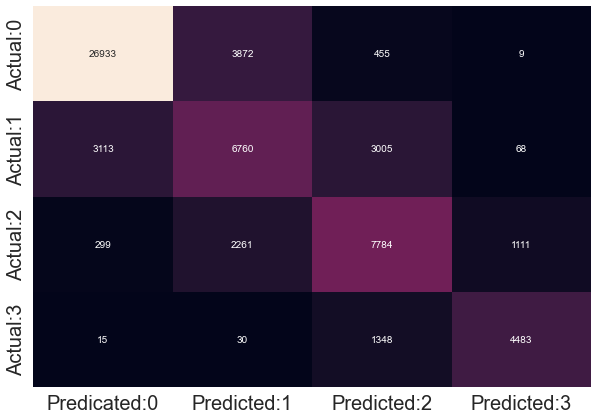

In [375]:
cm(y_test,y_pred)

#### Inferences:

1. `26977` observations in `Minor(0)` class are correctly while `4292` are wrongly classified.
2. `6687` observations in `Moderate(1)` class are correctly while `6259` are wrongly classified.
3. `7791` observations in `Major(2)` class are correctly while `3664` are wrongly classified.
4. `4475` observations in `Extreme(3)` class are correctly while `1401` are wrongly classified.

### Reciever Operating Characteristics (ROC) Curve

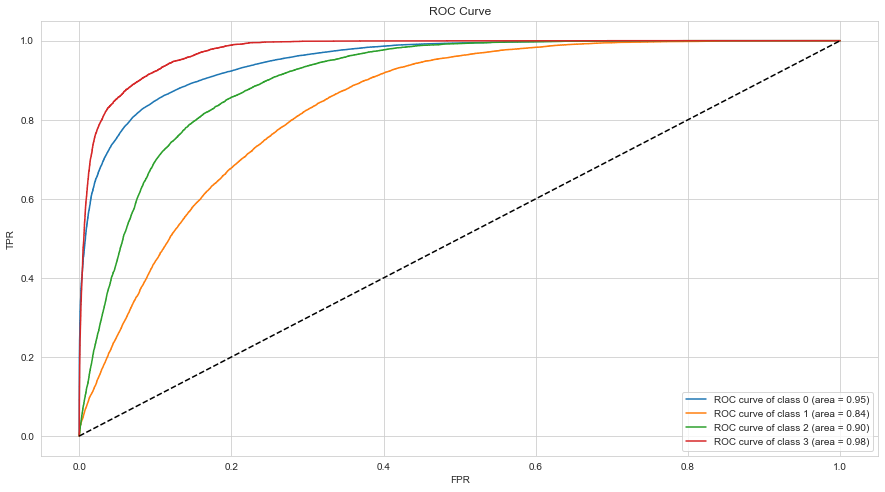

In [374]:
y_test_labels=label_binarize(y_test,classes=[0,1,2,3])
y_prob = xgbc_tuned.predict_proba(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(4):
    fpr[i], tpr[i], _ = roc_curve(y_test_labels[:,i], y_prob[:, i])
    roc_auc[i] = roc_auc_score(y_test_labels[:,i], y_prob[:, i])
    
colors = ['blue', 'red', 'green','yellow']
for i, color in zip(range(4), colors):
    plt.plot(fpr[i], tpr[i],label='ROC curve of class {0} (area = {1:0.2f})'''.format(i, roc_auc[i]))
    
plt.plot([0,1],[0,1],'k--')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.title('ROC Curve')
plt.legend()
plt.show()

#### Inference:There is good separation for all the different classes.

<a id=13></a>
### 13. PCA & KMeans Clustering for Demographic Variations

**Using transformed and scaled dataframe for performing Clustering & PCA.**

In [378]:
scaler = StandardScaler()
health_data_clustering = pd.DataFrame(scaler.fit_transform(health_data_class),columns=health_data_class.columns)
health_data_clustering.head()

,Hospital Service Area,Hospital County,Permanent Facility Id,Age Group,Zip Code - 3 digits,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Procedure Code,APR DRG Code,APR MDC Code,APR Severity of Illness Code,APR Risk of Mortality,Payment Typology 1,Total Charges,Total Costs,Gender_M,Race_Multi-racial,Race_Other Race,Race_White,Ethnicity_Not Span/Hispanic,Ethnicity_Spanish/Hispanic,APR Medical Surgical Description_Surgical,Emergency Department Indicator_Y
0,0.680013,0.048821,-0.748317,1.145856,-0.190872,-0.572349,0.667434,-0.617630,-0.675147,1.690330,0.219095,0.128679,-0.134652,0.124676,1.231427,0.133156,-0.680231,1.089829,-0.096736,-0.593196,0.908144,0.570145,-0.566805,-0.554166,0.770133
1,0.680013,1.393302,-0.170634,1.145856,-0.177223,-0.329446,0.667434,-0.617630,-1.135728,-0.191227,-0.693959,-0.714648,-0.134652,-0.846749,1.231427,-0.272035,-0.440629,-0.917575,-0.096736,-0.593196,-1.101147,0.570145,-0.566805,-0.554166,0.770133
2,-0.594549,0.897967,1.062555,0.437946,-0.272760,-0.572349,-1.232667,0.762572,0.231623,0.825015,-0.352592,-0.377317,-1.183522,-0.846749,1.231427,0.219247,0.373203,1.089829,-0.096736,-0.593196,0.908144,-1.753938,1.764274,1.804513,-1.298478
3,-0.594549,-0.163465,0.642013,0.437946,5.841602,-0.572349,-1.232667,-0.617630,-1.315643,0.593593,-0.973634,-0.883314,-1.183522,-0.846749,-0.875106,0.648637,0.639035,1.089829,-0.096736,-0.593196,0.908144,0.570145,-0.566805,1.804513,-1.298478
4,-0.594549,-0.163465,0.661469,0.437946,-0.293233,-0.329446,0.667434,-0.617630,1.404667,-0.483019,-1.117584,-1.051979,0.914219,1.096102,-0.785382,0.193061,-0.047710,1.089829,-0.096736,-0.593196,-1.101147,0.570145,-0.566805,-0.554166,0.770133


### PCA (Principal Component Analysis)

**As we can see we have number of features therefore, before performing clustering we would be implementing PCA for Dimensionality Reduction.**

### 13.1 Computing Covariance Matrix, Eigen Vaues & Eigen Vector

**Eigenvalues:** The diagonal values of the diagonalized covariance matrix are the `eigenvalues` of the covariance matrix. Large eigenvalues correspond to the large variance in the data.<br>
                        
**Eigenvectors:** The eigenvectors corresponds to the eigenvalues give directions of the maximum variation in the data.

In [379]:
cov_mat = np.cov(health_data_clustering.T)
eig_val, eig_vect = np.linalg.eig(cov_mat)
eig_val = list(eig_val)
eig_val.sort(reverse = True)


### 13.2 Deciding number of components through Percentage Variation 

In [380]:

percent_var = [((i/sum(eig_val))*100) for i in eig_val]
percent_var

# cumulative percentage variation
pd.Series(np.cumsum(percent_var),index=range(1,26))

1      19.777828
2      32.055032
3      40.722228
4      48.224388
5      54.043065
6      58.754661
7      63.178839
8      67.300014
9      71.328902
10     75.249647
11     78.870191
12     82.296467
13     85.511988
14     88.278974
15     90.465624
16     92.572170
17     94.544407
18     95.848799
19     97.015847
20     98.054107
21     98.819465
22     99.438170
23     99.831480
24     99.976973
25    100.000000
dtype: float64

**Intefrence: We can see that first 15 components explains95% of the variation in the data, we are considering 9 principal components which explains more than 70% variation for this dataset.**



**Now, we use the in-built python function `PCA()` from the sklearn library to calculate the principal components.**

In [381]:
components = PCA(n_components=9,random_state=1).fit_transform(health_data_clustering)
df_pca = pd.DataFrame(data = components, columns = [f'PCA{i}' for i in range(1,10)])
df_pca.head()



,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9
0,0.994469,-1.832399,-0.558417,0.702948,0.140031,-1.423593,-0.862880,-0.967540,0.744109
1,0.986631,-1.054495,-1.657258,-0.380080,1.021009,-0.411818,-0.916541,0.272960,-0.069503
2,-0.714474,1.208255,0.564185,-2.231641,-0.065607,0.787736,-2.306795,-1.721018,1.495781
3,-0.330712,-0.880742,1.419413,-3.961436,0.283889,-0.150569,1.488955,-2.304413,2.817339
4,1.026106,0.182703,-1.012931,-0.088671,1.076888,0.347429,1.875579,0.673722,-0.800719


In [382]:
# Shape of the PCA Dataset
df_pca.shape

(205152, 9)

**Inteference: In the above step, we obtained the data with reduced dimensions. The new dataset has 205152 records and 9 columns, i.e. we have decreased the number of features from 25 to 9.**

### K-Means Clustering

**Let us perform the centroid-based clustering algorithm (i.e. K-Means) on PCA dataset to find the Average charges on the basis of regions.**



**Here we consider two techniques (elbow/scree plot and Silhouette score) to decide the optimal value of `K` to perform the K-means clustering.`**

### 13.3 Elbow Method

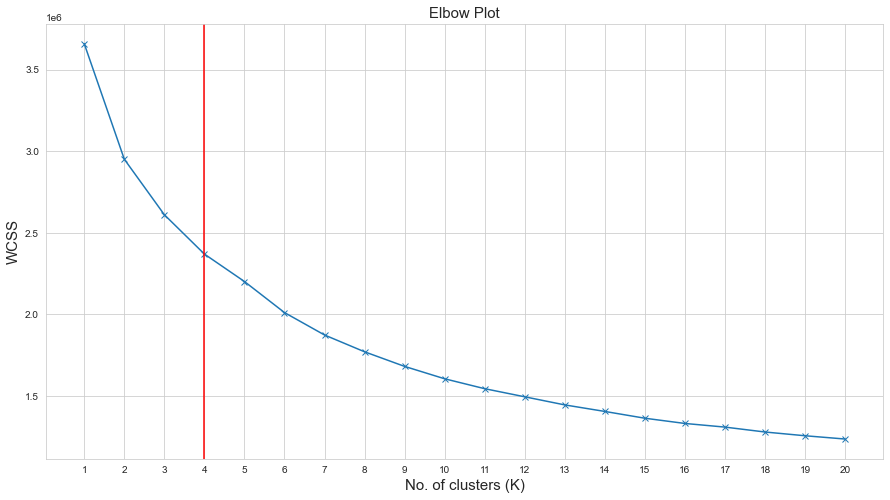

In [383]:
plt.rcParams['figure.figsize'] = [15,8]

wcss = []

for i in range(1,21):
    kmeans = KMeans(n_clusters=i,random_state=10).fit(df_pca)
    wcss.append(kmeans.inertia_)

    
plt.plot(range(1,21),wcss,'x-')
plt.xticks(range(1,21))
plt.title('Elbow Plot', fontsize = 15)
plt.xlabel('No. of clusters (K)', fontsize = 15)
plt.ylabel('WCSS', fontsize = 15)
plt.axvline(x = 4, color = 'red')
plt.show()

**Interference:** We can see that the for K = 4, there is an elbow in the plot. Before this elbow point, the WCSS is decreasing rapidly and after K = 4, the WCSS is decreasing slowly.

Now, let us use the silhouette score method to identify the optimal value of K.

### 13.4 Silhouette score

In [384]:
silhouette_scores = [] 

for i in range(2,11):
    cluster = KMeans (n_clusters= i, random_state= 10).fit_predict(df_pca)
    score = silhouette_score(df_pca, cluster, random_state= 10)
    silhouette_scores.append(score)
    print ("For {} clusters the silhouette score is {})".format(i, score))

For 2 clusters the silhouette score is 0.19230423618678139)
For 3 clusters the silhouette score is 0.1905962411558109)
For 4 clusters the silhouette score is 0.16837807322961473)
For 5 clusters the silhouette score is 0.1715588302227996)
For 6 clusters the silhouette score is 0.1794004808976742)
For 7 clusters the silhouette score is 0.18052217142352128)
For 8 clusters the silhouette score is 0.18212587732945232)
For 9 clusters the silhouette score is 0.16774400703183961)
For 10 clusters the silhouette score is 0.16984466961731587)


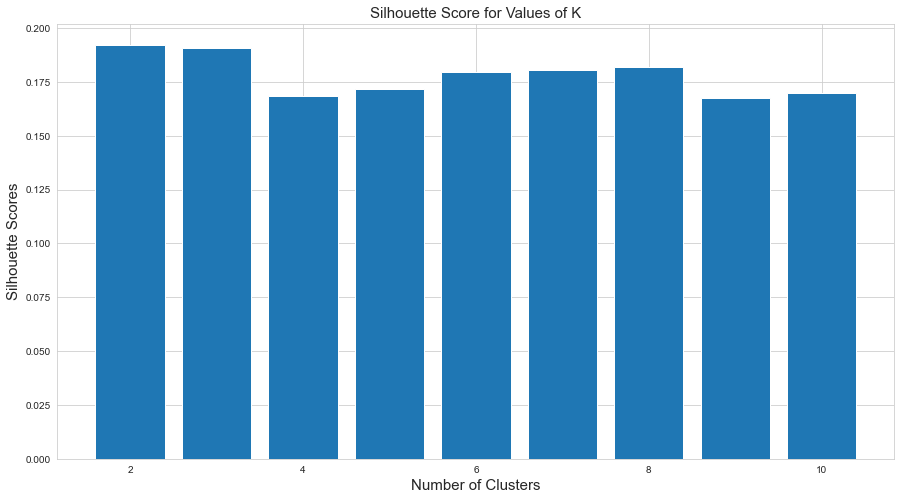

In [420]:
K = [i for i in range(2,11)]
plt.bar(K, silhouette_scores) 
plt.title('Silhouette Score for Values of K', fontsize = 15)
plt.xlabel('Number of Clusters', fontsize = 15) 
plt.ylabel('Silhouette Scores', fontsize = 15)
plt.show()

**Inference:** Also from the above output, we can see that the silhouette score is maximum for k = 4 . Thus we chose K = 4 as the optimal value of k.

In [79]:
# build a K-Means model with 4 clusters and fit the model
kmeans = KMeans(n_clusters=4,random_state=10).fit(df_pca)

# append the cluster label for each point in the original dataframe 
kmeans_cluster =health_data_original.copy()
kmeans_cluster['Cluster']= kmeans.labels_
kmeans_cluster.head()

,Hospital Service Area,Hospital County,Permanent Facility Id,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Code,APR DRG Description,APR MDC Code,APR MDC Description,APR Severity of Illness Code,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Emergency Department Indicator,Total Charges,Total Costs,Cluster
0,Long Island,Nassau,527.0,Mount Sinai South Nassau,70 or Older,115.0,M,White,Not Span/Hispanic,1,Emergency,Home or Self Care,GEN006,OTHER SPECIFIED AND UNSPECIFIED DISEASES OF KI...,URN003,URETER AND OTHER URINARY TRACT DILATION,465,URINARY STONES AND ACQUIRED UPPER URINARY TRAC...,11,DISEASES AND DISORDERS OF THE KIDNEY AND URINA...,2,Moderate,Moderate,Medical,Medicare,Y,44700.74,5665.27,2
1,Long Island,Suffolk,913.0,Huntington Hospital,70 or Older,117.0,F,Black/African American,Not Span/Hispanic,3,Emergency,Home or Self Care,DIG004,ESOPHAGEAL DISORDERS,GIS001,ESOPHAGOGASTRODUODENOSCOPY (EGD) WITH BIOPSY,243,OTHER ESOPHAGEAL DISORDERS,6,DISEASES AND DISORDERS OF THE DIGESTIVE SYSTEM,2,Moderate,Minor,Medical,Medicare,Y,28758.57,7316.03,2
2,New York City,Richmond,1737.0,Staten Island University Hospital Prince's Bay,50 to 69,103.0,M,White,Spanish/Hispanic,1,Elective,Home w/ Home Health Services,MUS006,OSTEOARTHRITIS,MST006,KNEE ARTHROPLASTY,326,ELECTIVE KNEE JOINT REPLACEMENT,8,DISEASES AND DISORDERS OF THE MUSCULOSKELETAL ...,1,Minor,Minor,Surgical,Medicare,N,49101.93,17500.81,3
3,New York City,Manhattan,1456.0,Mount Sinai Hospital,50 to 69,999.0,M,White,Not Span/Hispanic,1,Elective,Home or Self Care,CIR017,CARDIAC DYSRHYTHMIAS,MAM009,ELECTROPHYSIOLOGIC STUDIES,175,PERCUTANEOUS CARDIAC INTERVENTION WITHOUT AMI,5,DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM,1,Minor,Minor,Surgical,Blue Cross/Blue Shield,N,78518.48,23299.16,2
4,New York City,Manhattan,1469.0,Mount Sinai Morningside,50 to 69,100.0,M,Black/African American,Not Span/Hispanic,3,Emergency,Home or Self Care,RSP008,CHRONIC OBSTRUCTIVE PULMONARY DISEASE AND BRON...,ESA004,NON-INVASIVE VENTILATION,140,CHRONIC OBSTRUCTIVE PULMONARY DISEASE,4,DISEASES AND DISORDERS OF THE RESPIRATORY SYSTEM,3,Major,Major,Medical,Medicaid,Y,47718.87,11138.85,2


**Size of each cluster**

In [80]:
kmeans_cluster.Cluster.value_counts()

Cluster
2    74374
0    53445
3    40306
1    37027
Name: count, dtype: int64

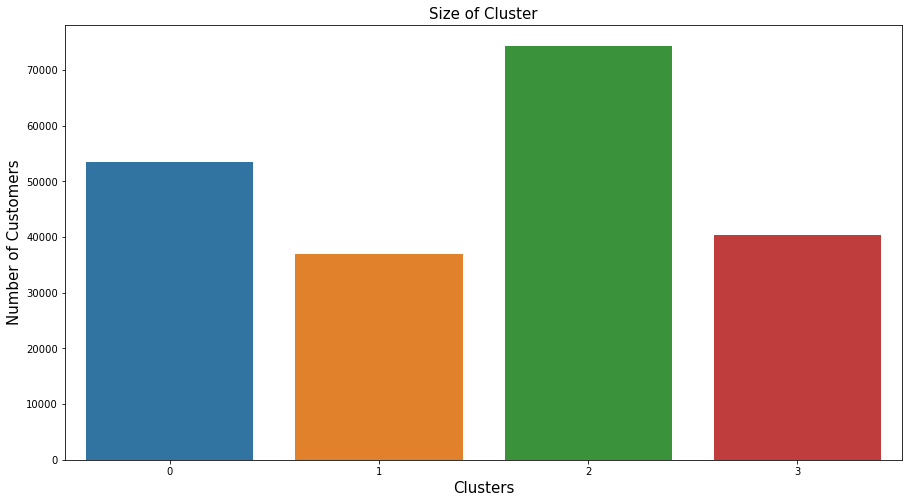

In [81]:

sns.countplot(x = kmeans_cluster['Cluster'])

plt.title('Size of Cluster', fontsize = 15)
plt.xlabel('Clusters', fontsize = 15)
plt.ylabel('Number of Customers', fontsize = 15)
plt.show()

**Inference: The 3rd cluster contains maximum observation of about 74374.**

### 13.5 Understanding summary of each cluster

In [82]:
cat_cols = ['Hospital Service Area','Age Group','Gender',
            'Race','Ethnicity','Type of Admission','Patient Disposition','APR Risk of Mortality',
          'APR Medical Surgical Description','Payment Typology 1','Emergency Department Indicator']

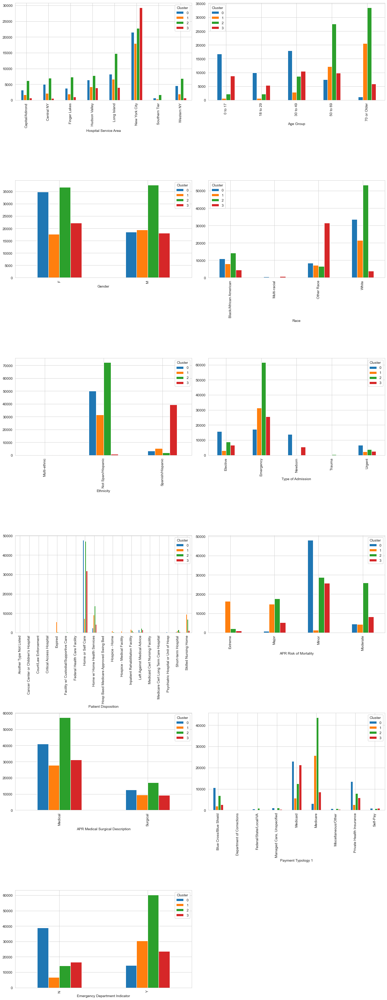

In [83]:
import matplotlib.pyplot as plt
index=1
plt.figure(figsize=(15,45))
sns.set_style('whitegrid')
for i in cat_cols:
    ax=plt.subplot(7,2,index)
    pd.crosstab(kmeans_cluster[i],kmeans_cluster['Cluster']).plot.bar(ax=ax)
    index+=1
plt.tight_layout()
plt.show()

### Cluster 1

**Statitical summary of Cluster 1**

In [84]:
# statistical summary of the numerical variables
kmeans_cluster[kmeans_cluster.Cluster == 0].describe()

,Permanent Facility Id,Zip Code - 3 digits,Length of Stay,APR DRG Code,APR MDC Code,APR Severity of Illness Code,Total Charges,Total Costs,Cluster
count,53445.000000,53445.000000,53445.000000,53445.000000,53445.000000,53445.000000,5.344500e+04,5.344500e+04,53445.0
mean,1011.799906,149.468556,3.583216,605.522631,14.974946,1.535504,3.318766e+04,1.030391e+04,0.0
std,713.185133,159.373331,4.276730,146.859988,3.810150,0.644011,4.076266e+04,1.507420e+04,0.0
min,1.000000,100.000000,1.000000,8.000000,1.000000,1.000000,1.141000e+01,1.330000e+00,0.0
25%,513.000000,112.000000,2.000000,541.000000,14.000000,1.000000,1.074100e+04,3.412260e+03,0.0
50%,943.000000,116.000000,2.000000,640.000000,15.000000,1.000000,2.193519e+04,7.321180e+03,0.0
75%,1453.000000,133.000000,4.000000,720.000000,18.000000,2.000000,4.044632e+04,1.266189e+04,0.0
max,9431.000000,999.000000,88.000000,952.000000,25.000000,4.000000,1.056965e+06,1.675144e+06,0.0


In [85]:
# statistical summary of the categorical variables
kmeans_cluster[kmeans_cluster.Cluster == 0].describe(include = object)

,Hospital Service Area,Hospital County,Facility Name,Age Group,Gender,Race,Ethnicity,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Description,APR MDC Description,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Emergency Department Indicator
count,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445,53445
unique,8,56,192,5,2,4,3,5,18,369,369,284,284,275,24,4,4,2,9,2
top,New York City,Manhattan,Mount Sinai Hospital,30 to 49,F,White,Not Span/Hispanic,Emergency,Home or Self Care,PNL001,LIVEBORN,PGN002,SPONTANEOUS VAGINAL DELIVERY,"NEONATE BIRTH WEIGHT > 2499 GRAMS, NORMAL NEWB...","PREGNANCY, CHILDBIRTH AND THE PUERPERIUM",Minor,Minor,Medical,Medicaid,N
freq,21574,9097,1479,17983,34870,33669,50184,17115,47746,13829,13829,8838,8838,12182,15582,29102,48150,40874,23057,38924


**Cluster 1:**

The above summary shows that the average Length of Stay in this cluster is approximately 4. On average, total charges are 33187.66 dollars and, belong to age group 30 to 49 years. Approximately 65% of the patients are female and 62% are white 93% are Not Span/Hispanic with frequent diagnosis of Liveborn which needs Home or Self care after getting discharged.

Here, cluster reveals valuable insights into the characteristics and trends of this subgroup, contributing to a deeper understanding of factors affecting livebirth outcomes with minor risk of mortality.

### Cluster 2

**Statitical summary of Cluster 2**

In [86]:
# statistical summary of the numerical variables
kmeans_cluster[kmeans_cluster.Cluster == 1].describe()

,Permanent Facility Id,Zip Code - 3 digits,Length of Stay,APR DRG Code,APR MDC Code,APR Severity of Illness Code,Total Charges,Total Costs,Cluster
count,37027.000000,37027.000000,37027.000000,37027.000000,37027.000000,37027.000000,3.702700e+04,3.702700e+04,37027.0
mean,1057.487968,139.876874,14.496368,430.190510,10.834445,3.352473,1.986861e+05,5.967915e+04,1.0
std,619.416428,142.441097,14.696194,279.225668,6.701298,0.664737,2.961208e+05,9.427403e+04,0.0
min,1.000000,100.000000,1.000000,1.000000,1.000000,1.000000,3.260840e+03,1.116220e+03,1.0
25%,541.000000,107.000000,6.000000,175.000000,5.000000,3.000000,7.000265e+04,2.065088e+04,1.0
50%,1139.000000,113.000000,10.000000,380.000000,9.000000,3.000000,1.229691e+05,3.588620e+04,1.0
75%,1456.000000,124.000000,17.000000,720.000000,18.000000,4.000000,2.218046e+05,6.521948e+04,1.0
max,3975.000000,999.000000,120.000000,952.000000,25.000000,4.000000,1.021094e+07,3.770450e+06,1.0


In [87]:
# statistical summary of the categorical variables
kmeans_cluster[kmeans_cluster.Cluster == 1].describe(include = object)

,Hospital Service Area,Hospital County,Facility Name,Age Group,Gender,Race,Ethnicity,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Description,APR MDC Description,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Emergency Department Indicator
count,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027,37027
unique,8,54,180,5,2,4,3,5,19,377,377,287,287,313,24,4,4,2,9,2
top,New York City,Manhattan,NYU Langone Hospitals,70 or Older,M,White,Not Span/Hispanic,Emergency,Skilled Nursing Home,INF002,SEPTICEMIA,CAR024,VENOUS AND ARTERIAL CATHETER PLACEMENT,SEPTICEMIA AND DISSEMINATED INFECTIONS,INFECTIOUS AND PARASITIC DISEASES (SYSTEMIC OR...,Extreme,Extreme,Medical,Medicare,Y
freq,18004,7430,1117,20580,19426,21569,31572,31269,9504,9265,9265,3427,3427,8077,9860,16875,16399,27676,25832,30400


**Cluster 2:**

The above summary shows that the average Length of Stay in this cluster is approximately 14. On average, their total charges are 198686 dollars, and belong to the age group 70 or Older. Approximately 52% of the patients are male with frequent diagnoses of SEPTICEMIA which needs Skilled Nursing Home care after getting discharged.

Here, the cluster reveals valuable insights into the characteristics and trends of this subgroup, contributing to a deeper understanding of factors affecting a serious bloodstream infection with Extreme Risk of Mortality


### Cluster 3

**Statitical summary of Cluster 3**

In [88]:
# statistical summary of the numerical variables
kmeans_cluster[kmeans_cluster.Cluster == 2].describe()

,Permanent Facility Id,Zip Code - 3 digits,Length of Stay,APR DRG Code,APR MDC Code,APR Severity of Illness Code,Total Charges,Total Costs,Cluster
count,74374.000000,74374.000000,74374.000000,74374.000000,74374.000000,74374.000000,7.437400e+04,74374.000000,74374.0
mean,865.069393,147.366512,3.717092,251.419058,6.278189,2.079477,4.993021e+04,13834.950534,2.0
std,600.297004,148.443307,2.747233,161.589639,3.798146,0.773914,4.665609e+04,12125.902099,0.0
min,1.000000,100.000000,1.000000,2.000000,1.000000,1.000000,2.200000e+02,46.160000,2.0
25%,413.000000,112.000000,2.000000,139.000000,4.000000,2.000000,2.066687e+04,6077.610000,2.0
50%,776.000000,117.000000,3.000000,204.000000,5.000000,2.000000,3.666472e+04,10306.475000,2.0
75%,1305.000000,136.000000,5.000000,324.000000,8.000000,3.000000,6.313782e+04,17290.352500,2.0
max,3975.000000,999.000000,43.000000,952.000000,25.000000,4.000000,1.141339e+06,416089.860000,2.0


In [89]:
# statistical summary of the categorical variables
kmeans_cluster[kmeans_cluster.Cluster == 2].describe(include = object)

,Hospital Service Area,Hospital County,Facility Name,Age Group,Gender,Race,Ethnicity,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Description,APR MDC Description,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Emergency Department Indicator
count,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374,74374
unique,8,56,188,5,2,4,3,4,19,361,361,287,287,275,23,4,4,2,9,2
top,New York City,Manhattan,North Shore University Hospital,70 or Older,M,White,Not Span/Hispanic,Emergency,Home or Self Care,INF012,CORONAVIRUS DISEASE 2019 (COVID-19),ESA004,NON-INVASIVE VENTILATION,MAJOR RESPIRATORY INFECTIONS AND INFLAMMATIONS,DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM,Moderate,Minor,Medical,Medicare,Y
freq,22748,8433,2026,33565,37628,53329,72292,61496,47088,4228,4228,4932,4932,4743,16352,34405,28660,57313,43641,60158


**Cluster 3:**

The above summary shows that the average Length of Stay in this cluster is approximately 4 and consists of the highest number of observations. On average, their total charges are 49930 dollars and belong to the age group 70 or Older. Approximately 71% of the patients are white and 97% are Not Span/Hispanic with frequent diagnoses of CORONAVIRUS DISEASE 2019 (COVID-19) which needs Home or Self Care or quarantine after getting discharged.

Here, the cluster yields valuable insights into the distinctive attributes and patterns of this subgroup, leading to a deep understanding of the factors that impact COVID disease outcomes with Minor to Moderate Risk of Mortality.
	



### Cluster 4

**Statitical summary of Cluster 4**

In [90]:
# statistical summary of the numerical variables
kmeans_cluster[kmeans_cluster.Cluster == 3].describe()

,Permanent Facility Id,Zip Code - 3 digits,Length of Stay,APR DRG Code,APR MDC Code,APR Severity of Illness Code,Total Charges,Total Costs,Cluster
count,40306.000000,40306.000000,40306.000000,40306.000000,40306.000000,40306.000000,4.030600e+04,4.030600e+04,40306.0
mean,1318.025902,129.083784,4.148960,433.612886,10.711036,1.880241,5.393594e+04,1.773092e+04,3.0
std,668.164885,126.607976,4.669086,233.422651,5.706160,0.810564,6.482255e+04,2.316901e+04,0.0
min,1.000000,100.000000,1.000000,1.000000,1.000000,1.000000,4.605000e+01,6.560000e+00,3.0
25%,1122.000000,104.000000,2.000000,220.000000,5.000000,1.000000,1.894184e+04,6.363122e+03,3.0
50%,1301.000000,112.000000,3.000000,442.000000,10.000000,2.000000,3.523069e+04,1.183715e+04,3.0
75%,1464.000000,114.000000,5.000000,640.000000,15.000000,2.000000,6.472340e+04,2.140715e+04,3.0
max,9059.000000,999.000000,70.000000,952.000000,25.000000,4.000000,1.565794e+06,1.696250e+06,3.0


In [91]:
# statistical summary of the categorical variables
kmeans_cluster[kmeans_cluster.Cluster == 3].describe(include = object)

,Hospital Service Area,Hospital County,Facility Name,Age Group,Gender,Race,Ethnicity,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Description,APR MDC Description,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Emergency Department Indicator
count,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306,40306
unique,8,50,172,5,2,4,3,5,19,407,407,296,296,318,24,4,4,2,9,2
top,New York City,Manhattan,New York-Presbyterian Hospital - Columbia Pres...,30 to 49,F,Other Race,Spanish/Hispanic,Emergency,Home or Self Care,PNL001,LIVEBORN,ADM010,VACCINATIONS,"NEONATE BIRTH WEIGHT > 2499 GRAMS, NORMAL NEWB...",NEWBORNS AND OTHER NEONATES WITH CONDITIONS OR...,Moderate,Minor,Medical,Medicaid,Y
freq,29337,10786,1851,10465,22161,31405,39403,25489,31763,5553,5553,3447,3447,4721,5705,16424,25804,31089,21282,23696


**Cluster 4:**

The above summary shows that the average Length of Stay in this cluster is approximately 4. On average, their total charges are 53936 dollars and belong to the age group 30 to 49. Approximately 77% of the patients are of other races and 97% are Spain/Hispanic with frequent diagnoses of Liveborn as Emergency which needs Home or Self Care after getting discharged.


Here, the cluster yields valuable insights into the distinctive attributes and patterns of this subgroup, leading to a deep understanding of the factors that impact livebirth outcomes with Minor to Moderate Risk of Mortality.




### 13.6 Analysis on Top five Diagnosis for the dataset

In [92]:
# Top 5 diagnosis 
kmeans_cluster['CCSR Diagnosis Description'].value_counts().index[:5]

Index(['LIVEBORN', 'SEPTICEMIA', 'CORONAVIRUS DISEASE 2019 (COVID-19)',
       'HEART FAILURE', 'DIABETES MELLITUS WITH COMPLICATION'],
      dtype='object', name='CCSR Diagnosis Description')

In [93]:
# Dataset of top five diagnosis
kmeans_cluster_ = kmeans_cluster[(kmeans_cluster['CCSR Diagnosis Description'] == 'LIVEBORN')|
               (kmeans_cluster['CCSR Diagnosis Description'] =='SEPTICEMIA')|
               (kmeans_cluster['CCSR Diagnosis Description'] =='CORONAVIRUS DISEASE 2019 (COVID-19)')|
               (kmeans_cluster['CCSR Diagnosis Description'] =='HEART FAILURE')|
               (kmeans_cluster['CCSR Diagnosis Description'] =='DIABETES MELLITUS WITH COMPLICATION')]

**Check the size of dataset**

In [94]:
kmeans_cluster_.shape

(50932, 29)

**Counts of observation in each cluster**

In [95]:
kmeans_cluster_['Cluster'].value_counts()

Cluster
0    14940
1    14667
2    11740
3     9585
Name: count, dtype: int64

**Visualization for Top five diagnosis**

<Figure size 1080x3240 with 0 Axes>

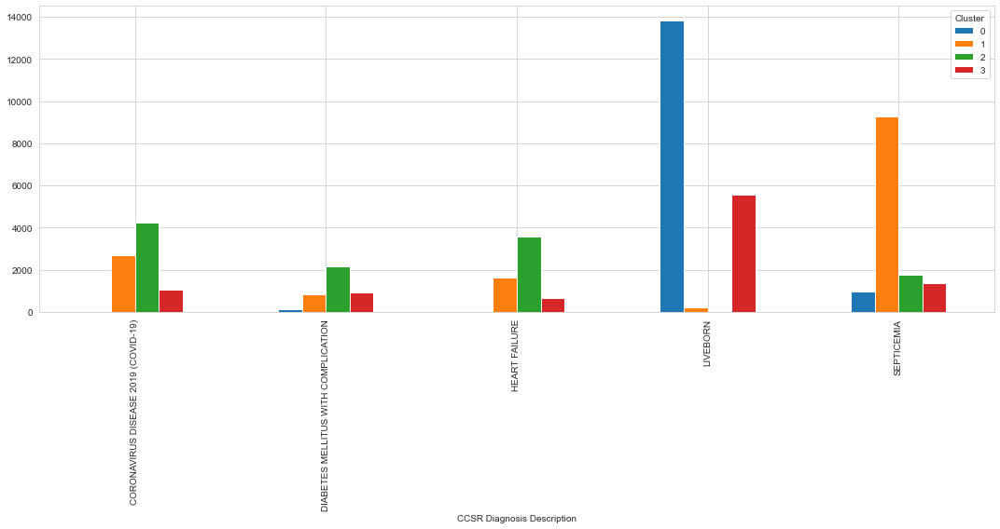

In [96]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,45))
sns.set_style('whitegrid')
pd.crosstab(kmeans_cluster_['CCSR Diagnosis Description'],kmeans_cluster_['Cluster']).plot.bar()
plt.tight_layout()
plt.show()

**Inference:** From the above visualization and clusters summary, we can formulate the conclusion:
- Cluster 1 = Cluster belongs to the subgroup, that impact livebirth outcomes for Not Spanish/Hispanic ethnicity.
- Cluster 2 = Cluster belongs to the subgroup, that impact Septicemia outcomes.
- Cluster 3 = Cluster belongs to the subgroup, that impact Covid disease outcomes.
- Cluster 4 = Cluster belongs to the subgroup, that impact livebirth outcomes for Spanish/Hispanic ethnicity.


### 13.7 Diagnosis on Regional basis

In [97]:
import plotly.express as px
fig = px.box(kmeans_cluster_, y='Hospital Service Area', x='CCSR Diagnosis Description', color="Cluster")
fig.show()


**Inference:** 
From the above plot we can see Maximum Diagnosis Observation for the particular region i.e.
- Most Liveborn cases in Central NY.
- Most Septicemia cases in Southern Tier.
- People of Southern Tier are more prone to have COVID-19.

In [98]:
cluster_diagnosis_counts =pd.DataFrame(kmeans_cluster_.groupby(['Hospital Service Area','Cluster','CCSR Diagnosis Description'])['CCSR Diagnosis Description'].value_counts())
cluster_diagnosis_counts

count
Hospital Service Area Cluster CCSR Diagnosis Description                
Capital/Adirond       0       DIABETES MELLITUS WITH COMPLICATION     14
                              LIVEBORN                               616
                              SEPTICEMIA                              86
                      1       CORONAVIRUS DISEASE 2019 (COVID-19)    121
                              DIABETES MELLITUS WITH COMPLICATION     44
                              HEART FAILURE                           63
                              LIVEBORN                                 7
                              SEPTICEMIA                             511
                      2       CORONAVIRUS DISEASE 2019 (COVID-19)    313
                              DIABETES MELLITUS WITH COMPLICATION    161
                              HEART FAILURE                          341
                              SEPTICEMIA                             183
                      3       CORONAVIRUS DISEASE 2019 (COVID-19)      4
                              DIABETES MELLITUS WITH COMPLICATION     10
                              HEART FAILURE                            4
                              LIVEBORN                               302
                              SEPTICEMIA                              17
Central NY            0       DIABETES MELLITUS WITH COMPLICATION     19
                              HEART FAILURE                            2
                              LIVEBORN                              1257
                              SEPTICEMIA                             119
                      1       CORONAVIRUS DISEASE 2019 (COVID-19)    190
                              DIABETES MELLITUS WITH COMPLICATION     45
                              HEART FAILURE                           81
                              LIVEBORN                                14
                              SEPTICEMIA                             586
                      2       CORONAVIRUS DISEASE 2019 (COVID-19)    440
                              DIABETES MELLITUS WITH COMPLICATION    227
                              HEART FAILURE                          373
                              SEPTICEMIA                             226
                      3       CORONAVIRUS DISEASE 2019 (COVID-19)     18
                              DIABETES MELLITUS WITH COMPLICATION     17
                              HEART FAILURE                            7
                              LIVEBORN                               142
                              SEPTICEMIA                              24
Finger Lakes          0       DIABETES MELLITUS WITH COMPLICATION     10
                              LIVEBORN                               933
                              SEPTICEMIA                              89
                      1       CORONAVIRUS DISEASE 2019 (COVID-19)    152
                              DIABETES MELLITUS WITH COMPLICATION     38
                              HEART FAILURE                           91
                              LIVEBORN                                18
                              SEPTICEMIA                             619
                      2       CORONAVIRUS DISEASE 2019 (COVID-19)    441
                              DIABETES MELLITUS WITH COMPLICATION    201
                              HEART FAILURE                          401
                              SEPTICEMIA                             283
                      3       CORONAVIRUS DISEASE 2019 (COVID-19)     35
                              DIABETES MELLITUS WITH COMPLICATION     19
                              HEART FAILURE                           15
                              LIVEBORN                               261
                              SEPTICEMIA                              33
Hudson Valley         0       CORONAVIRUS DISEASE 2019 (COVID-19)      3
                              DIABETES MELLITUS WITH

### 13.8 Geographical representation of Average Total charges for each Hospital Service Area 

**Adding Latitude and Longitude features for plot in the map**

In [99]:
coordinates = {
    'Hudson Valley': {'latitude': 41.3902, 'longitude': -73.9543},
    'Central NY': {'latitude': 43.0481, 'longitude': -76.1474},
    'Capital/Adirond': {'latitude': 43.9776, 'longitude': -75.9219},
    'Long Island': {'latitude': 40.7891, 'longitude': -73.1340},
    'New York City': {'latitude': 40.7128, 'longitude': -74.0060},
    'Western NY': {'latitude': 43.1566, 'longitude': -79.0452},
    'Finger Lakes': {'latitude': 42.8699, 'longitude': -77.2540},
    'Southern Tier': {'latitude': 42.0987, 'longitude': -76.0530}
}
kmeans_cluster_['latitude'] = kmeans_cluster_['Hospital Service Area'].map(coordinates).apply(lambda x: x.get('latitude'))
kmeans_cluster_['longitude'] =kmeans_cluster_['Hospital Service Area'].map(coordinates).apply(lambda x: x.get('longitude'))


In [100]:
kmeans_cluster_.head()

,Hospital Service Area,Hospital County,Permanent Facility Id,Facility Name,Age Group,Zip Code - 3 digits,Gender,Race,Ethnicity,Length of Stay,Type of Admission,Patient Disposition,CCSR Diagnosis Code,CCSR Diagnosis Description,CCSR Procedure Code,CCSR Procedure Description,APR DRG Code,APR DRG Description,APR MDC Code,APR MDC Description,APR Severity of Illness Code,APR Severity of Illness Description,APR Risk of Mortality,APR Medical Surgical Description,Payment Typology 1,Emergency Department Indicator,Total Charges,Total Costs,Cluster,latitude,longitude
5,Hudson Valley,Westchester,1122.0,New York - Presbyterian Hospital,70 or Older,105.0,M,White,Not Span/Hispanic,16,Emergency,Home w/ Home Health Services,INF002,SEPTICEMIA,ADM001,TRANSFUSION OF BLOOD AND BLOOD PRODUCTS,720,SEPTICEMIA AND DISSEMINATED INFECTIONS,18,INFECTIOUS AND PARASITIC DISEASES (SYSTEMIC OR...,3,Major,Major,Medical,Medicare,Y,206708.87,45129.80,1,41.3902,-73.9543
14,Central NY,Cayuga,85.0,Auburn Community Hospital,50 to 69,130.0,M,White,Not Span/Hispanic,8,Emergency,Skilled Nursing Home,END003,DIABETES MELLITUS WITH COMPLICATION,MST023,TOE AND MID FOOT AMPUTATION,305,AMPUTATION OF LOWER LIMB EXCEPT TOES,8,DISEASES AND DISORDERS OF THE MUSCULOSKELETAL ...,3,Major,Moderate,Surgical,Medicare,Y,59059.70,16016.67,2,43.0481,-76.1474
23,Capital/Adirond,Schenectady,829.0,Ellis Hospital,50 to 69,123.0,M,Other Race,Not Span/Hispanic,4,Emergency,Home or Self Care,END003,DIABETES MELLITUS WITH COMPLICATION,MST002,BONE AND JOINT BIOPSY,420,DIABETES,10,"ENDOCRINE, NUTRITIONAL AND METABOLIC DISEASES ...",3,Major,Moderate,Medical,Private Health Insurance,Y,32609.75,9580.96,2,43.9776,-75.9219
27,Long Island,Suffolk,924.0,South Shore University Hospital,50 to 69,117.0,F,Other Race,Spanish/Hispanic,15,Emergency,Expired,INF002,SEPTICEMIA,FRS002,OOPHORECTOMY,710,INFECTIOUS AND PARASITIC DISEASES INCLUDING HI...,18,INFECTIOUS AND PARASITIC DISEASES (SYSTEMIC OR...,4,Extreme,Extreme,Surgical,Medicaid,Y,401363.66,87058.40,1,40.7891,-73.1340
28,New York City,Bronx,1178.0,BronxCare Hospital Center,50 to 69,104.0,F,Black/African American,Spanish/Hispanic,2,Emergency,Home or Self Care,CIR019,HEART FAILURE,ADM001,TRANSFUSION OF BLOOD AND BLOOD PRODUCTS,194,HEART FAILURE,5,DISEASES AND DISORDERS OF THE CIRCULATORY SYSTEM,2,Moderate,Moderate,Medical,Medicaid,Y,20692.99,22167.83,3,40.7128,-74.0060


**Demographic representation for each Service Area**

In [101]:
import plotly.graph_objects as go

# Sample latitude and longitude coordinates
df_geo=kmeans_cluster_.groupby(['Hospital Service Area','CCSR Diagnosis Description','Cluster','longitude','latitude'])['Total Charges'].sum().reset_index(name='Total Charges')
df_geo=df_geo.sort_values(by='Total Charges',ascending= False)


df_geo['hover_text'] = df_geo.apply(lambda row: f"Hospital Service Area : {row['Hospital Service Area']}<br>Average Total Charges : {row['Total Charges']}", axis=1)

cluster_colors = ['blue', 'red', 'green','black']
traces =list()

for cluster in df_geo['Cluster'].unique():
    cluster_data = df_geo[df_geo['Cluster'] == cluster]
    trace = go.Scattermapbox(
        mode='markers',
        lon=cluster_data['longitude'],
        lat=cluster_data['latitude'],
        marker=dict(size=10, color=cluster_colors[cluster]),
        name=f'Cluster {cluster+1}',
        hovertext=cluster_data['hover_text'],  
#         text=cluster_data['CCSR Diagnosis Description'],
        
    )
    traces.append(trace)

# Create a layout with map style and center coordinates
layout = go.Layout(
    mapbox_style='carto-positron',
    mapbox_zoom=5,
    mapbox_center=dict(lat=42.8, lon=-75.5),
)

# Create a Figure object and add the traces and layout
fig = go.Figure(data=traces, layout=layout)
fig.show()

**Inference:**
- Above plot shows Demographic Variations of Total Charges for different locations on each cluster.

### Conclusion

**Prediction of Length of Stay**

- The length of stay of a patient is of great significance in the case of healthcare. Several complexities can arise if the length of stay of patients is not given importance. The longer an individual occupies a bed in your acute facility, the longer that person will require clinical attention from staff whose time could be better spent elsewhere. The patient's experience can be severely compromised if the individual must wait in a bed for longer than is clinically necessary.



- With good level of confidence, we can say that children admitted aged below 18 would usually stay for less no. of days. Newborn admissions usually take a stay of 2 days. Hospitals can allocate resources beforehand for patients suffering from severe illnesses or having higher risks of mortality as they can be expected to stay longer. Similarly, patients admitted in an emergency will stay longer so rooms can be separately kept aside.


**Prediction of Risk of Mortality**

- In the healthcare sector, mortality risk prediction helps medical professionals make informed decisions about patient care and treatment plans. By identifying patients who are at a higher risk of mortality, healthcare providers can prioritize resources, interventions, and preventive measures to improve patient outcomes. This knowledge allows for early intervention, timely medical interventions, and tailored treatment strategies.



- Based on insights, we can recommend that hospitals should focus on providing specialized care for older patients, particularly those aged 70 and above, as they have a higher risk of mortality. Hospitals should implement risk assessment protocols that take into account the different types of admission. Patients with 'Medicare' payment typology have been identified as having higher risks of mortality. This may indicate the need for enhanced care coordination, chronic disease management, and proactive interventions for patients covered by Medicare. Hospitals should prioritize the implementation of strategies to reduce mortality risks for patients admitted in emergency situations.



**Identifying Demographic Variations**

- Identifying regions where additional healthcare coverage is needed is crucial for improving healthcare access and equity. By identifying areas with inadequate healthcare coverage, policymakers, healthcare providers, and public health agencies can strategically allocate resources to address the gaps and ensure that underserved populations receive the necessary care. This can involve establishing new healthcare facilities, expanding existing infrastructure, recruiting healthcare professionals, and implementing targeted healthcare programs and interventions. 



- Manhattan County and New York City hospitals should collaborate with local health authorities, community organizations, and neighbouring healthcare facilities to address the higher risks of mortality collectively. Given the higher lengths of stay and severity of illness, hospitals should focus on optimizing capacity management and resource allocation. With the majority of admissions being emergency cases, hospitals should prioritize improvements in emergency care services. Given the prevalence of septicaemia diagnoses, hospitals should implement robust sepsis management protocols. Hospitals should prioritize patient safety initiatives to mitigate risks of mortality. This can include implementing quality improvement programs, enhancing infection prevention and control measures, and promoting a culture of safety among healthcare staff.

